# Análisis Bases de datos B2C

In [2]:
import sys
!pip install pandas
import pandas as pd
import numpy as np
import nltk


import re
import nltk
from joblib import dump, load
import matplotlib.pyplot as plt
pd.options.display.max_colwidth=200
%matplotlib inline
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler  # Asegúrate de importar StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score




import scipy.stats as stats
import seaborn as sns; sns.set()  # for plot styling

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.preprocessing import MinMaxScaler

from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D # for 3D plots
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd
from sklearn.model_selection import KFold, GridSearchCV, train_test_split
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import seaborn as sns
from sklearn.metrics import mean_squared_error as mse, r2_score, mean_absolute_error as mae


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import tree


from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder

# Para búsqueda de hiperparámetros
from sklearn.model_selection import GridSearchCV
# Para la validación cruzada
from sklearn.model_selection import KFold

# Metricas
from sklearn.metrics import confusion_matrix, classification_report, precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import ConfusionMatrixDisplay

from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

# q-q plots
import scipy.stats as stats


[notice] A new release of pip is available: 24.2 -> 25.1.1
[notice] To update, run: pip install --upgrade pip


Carga de datos 

In [3]:
pd1 = pd.read_csv('base_1_transaccional.txt', sep = '\t')
pd2 = pd.read_csv('base_2_cotizaciones.txt', sep = '\t')

df_trans_B2C = pd1.copy()
df_cot_B2C = pd2.copy()

Se cargan los datos y se generan copias para no modificar los datos originales

A continuación se realizaron los respectivos análisis y entendimiento de datos de ambas base B2C, por separado

# Transaccional B2C

## 1. Entendimiento y Perfilamiento de datos

In [4]:
df_trans_B2C.shape

(2099836, 18)

In [5]:
df_trans_B2C.sample(10)

,fecha,pedido,id,edad,municipio,zona,asesor,punto de venta,cluster,categoria_macro,categoria,subcategoria,producto,color,cantidad,precio,valor,alineación con portafolio estratégico
568901,1971-01-04,254749,158709,31,NATAGAIMA,TOLIMA,asesor_70,punto_venta_11,cluster_tienda_3,categoria_macro_2,categoria_3,subcategoria_9,producto_59,BLANCO,25.00,0.16,3.97,0.508032
1465925,1971-05-04,655165,7462,55,DON MATIAS,ANTIOQUIA,asesor_208,punto_venta_34,cluster_tienda_3,categoria_macro_2,categoria_7,subcategoria_5,producto_129,BLANCO,1.60,2.79,4.47,0.397440
84870,1972-04-30,38163,27327,43,GIRARDOTA,ANTIOQUIA,asesor_146,punto_venta_21,cluster_tienda_3,categoria_macro_4,categoria_11,subcategoria_12,producto_277,No encontrado,2.00,1.68,3.36,0.449280
522269,1971-01-24,233047,145936,56,CURITI,SANTANDER,asesor_56,punto_venta_1,cluster_tienda_1,categoria_macro_2,categoria_3,subcategoria_3,producto_40,No encontrado,6.00,0.56,3.38,0.352512
1991758,1971-09-09,886790,405552,31,ANAPOIMA,CUNDINAMARCA,asesor_130,punto_venta_37,cluster_tienda_3,categoria_macro_2,categoria_7,subcategoria_5,producto_304,No encontrado,3.24,3.06,9.91,0.850176
285218,1972-08-20,126781,77070,49,TIERRALTA,CÓRDOBA,asesor_114,punto_venta_23,cluster_tienda_3,categoria_macro_4,categoria_9,subcategoria_10,producto_360,No encontrado,1.00,19.21,19.21,2.578176
797418,1971-02-06,357436,208781,31,TIBIRITA,CUNDINAMARCA,asesor_160,punto_venta_38,cluster_tienda_3,categoria_macro_2,categoria_5,subcategoria_5,producto_369,NEGRO,1.71,4.28,7.33,0.870912
239342,1971-08-04,106161,1299,30,GUATICA,RISARALDA,asesor_204,punto_venta_28,cluster_tienda_2,categoria_macro_2,categoria_5,subcategoria_5,producto_384,BEIGE,1.94,2.47,4.79,0.373248
2074340,1972-09-10,922688,285075,42,NATAGAIMA,TOLIMA,asesor_170,punto_venta_4,cluster_tienda_2,categoria_macro_2,categoria_3,subcategoria_9,producto_67,GRIS,50.00,0.29,14.53,1.862784
1914365,1972-10-03,825531,2123,31,CASTILLA LA NUEVA,META,asesor_305,punto_venta_49,cluster_tienda_5,categoria_macro_2,categoria_3,subcategoria_3,producto_3,BEIGE,8.00,0.53,4.23,0.300672


In [6]:
df_trans_B2C.head()

,fecha,pedido,id,edad,municipio,zona,asesor,punto de venta,cluster,categoria_macro,categoria,subcategoria,producto,color,cantidad,precio,valor,alineación con portafolio estratégico
0,1971-04-30,2,2,52,EL CARMEN DE CHUCURI,SANTANDER,asesor_2,punto_venta_2,cluster_tienda_2,categoria_macro_1,categoria_2,subcategoria_2,producto_2,GRIS,1.00,32.88,32.88,2.920320
1,1971-04-30,3,3,31,VILLANUEVA,LA GUAJIRA,asesor_3,punto_venta_2,cluster_tienda_2,categoria_macro_2,categoria_3,subcategoria_3,producto_3,BEIGE,2.00,0.56,1.13,0.117504
2,1971-04-30,4,4,43,VILLANUEVA,LA GUAJIRA,asesor_4,punto_venta_2,cluster_tienda_2,categoria_macro_3,categoria_4,subcategoria_4,producto_4,No encontrado,1.00,8.38,8.38,1.251072
3,1971-04-30,5,5,31,VILLANUEVA,LA GUAJIRA,asesor_5,punto_venta_3,cluster_tienda_3,categoria_macro_2,categoria_5,subcategoria_5,producto_5,BLANCO,21.14,2.27,47.99,3.729024
4,1971-04-30,6,6,49,ARROYOHONDO,BOLÍVAR,asesor_6,punto_venta_4,cluster_tienda_2,categoria_macro_4,categoria_6,subcategoria_6,producto_6,No encontrado,1.00,9.96,9.96,1.223424


In [7]:
df_trans_B2C.describe()

,pedido,id,edad,cantidad,precio,valor,alineación con portafolio estratégico
count,2.099836e+06,2.099836e+06,2.099836e+06,2.099836e+06,2.099305e+06,2.099836e+06,2.099836e+06
mean,4.670092e+05,1.653520e+05,4.187073e+01,3.805441e+01,9.244210e+00,3.999169e+01,3.945120e+00
std,2.705491e+05,1.214593e+05,9.563071e+00,7.464008e+02,2.953051e+01,1.650740e+02,2.192130e+01
min,2.000000e+00,1.000000e+00,1.800000e+01,0.000000e+00,0.000000e+00,0.000000e+00,-2.418746e+04
25%,2.317010e+05,5.829400e+04,3.200000e+01,1.000000e+00,6.500000e-01,4.690000e+00,4.734720e-01
50%,4.668240e+05,1.379730e+05,4.300000e+01,3.020000e+00,2.990000e+00,1.332000e+01,1.410048e+00
75%,7.026782e+05,2.617442e+05,4.900000e+01,1.296000e+01,6.270000e+00,3.713000e+01,3.725568e+00
max,9.339360e+05,4.192260e+05,6.700000e+01,4.896890e+05,1.204348e+04,5.687609e+04,4.162227e+03


In [8]:
df_trans_B2C.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2099836 entries, 0 to 2099835
Data columns (total 18 columns):
 #   Column                                 Dtype  
---  ------                                 -----  
 0   fecha                                  object 
 1   pedido                                 int64  
 2   id                                     int64  
 3   edad                                   int64  
 4   municipio                              object 
 5   zona                                   object 
 6   asesor                                 object 
 7   punto de venta                         object 
 8   cluster                                object 
 9   categoria_macro                        object 
 10  categoria                              object 
 11  subcategoria                           object 
 12  producto                               object 
 13  color                                  object 
 14  cantidad                               float64
 15

In [9]:
# Para categorizar las variables en su tipo de dato
categorical_cols = df_trans_B2C.select_dtypes(include=["object"]).columns
numeric_cols = df_trans_B2C.select_dtypes(include=["number"]).columns
datetime_cols = df_trans_B2C.select_dtypes(include=["datetime"]).columns

# Imprimir las variables categóricas
print("Variables categóricas:")
print(", ".join(categorical_cols))

# Imprimir las variables numéricas
print("\nVariables numéricas:")
print(", ".join(numeric_cols))

# Imprimir las variables de fecha
print("\nVariables de fecha:")
print(", ".join(datetime_cols))

Variables categóricas:
fecha, municipio, zona, asesor, punto de venta, cluster, categoria_macro, categoria, subcategoria, producto, color

Variables numéricas:
pedido, id, edad, cantidad, precio, valor, alineación con portafolio estratégico

Variables de fecha:



Se observa que la columna de fecha no corresponde a un tipo fecha sino que es asignada como variable categórica

### 1.1 Atributos Numéricos

In [9]:
var_num = ['pedido', 'id', 'edad', 'cantidad', 'precio', 'valor', 'alineación con portafolio estratégico']

In [10]:
df_trans_B2C[var_num].describe()

,pedido,id,edad,cantidad,precio,valor,alineación con portafolio estratégico
count,2.099836e+06,2.099836e+06,2.099836e+06,2.099836e+06,2.099305e+06,2.099836e+06,2.099836e+06
mean,4.670092e+05,1.653520e+05,4.187073e+01,3.805441e+01,9.244210e+00,3.999169e+01,3.945120e+00
std,2.705491e+05,1.214593e+05,9.563071e+00,7.464008e+02,2.953051e+01,1.650740e+02,2.192130e+01
min,2.000000e+00,1.000000e+00,1.800000e+01,0.000000e+00,0.000000e+00,0.000000e+00,-2.418746e+04
25%,2.317010e+05,5.829400e+04,3.200000e+01,1.000000e+00,6.500000e-01,4.690000e+00,4.734720e-01
50%,4.668240e+05,1.379730e+05,4.300000e+01,3.020000e+00,2.990000e+00,1.332000e+01,1.410048e+00
75%,7.026782e+05,2.617442e+05,4.900000e+01,1.296000e+01,6.270000e+00,3.713000e+01,3.725568e+00
max,9.339360e+05,4.192260e+05,6.700000e+01,4.896890e+05,1.204348e+04,5.687609e+04,4.162227e+03


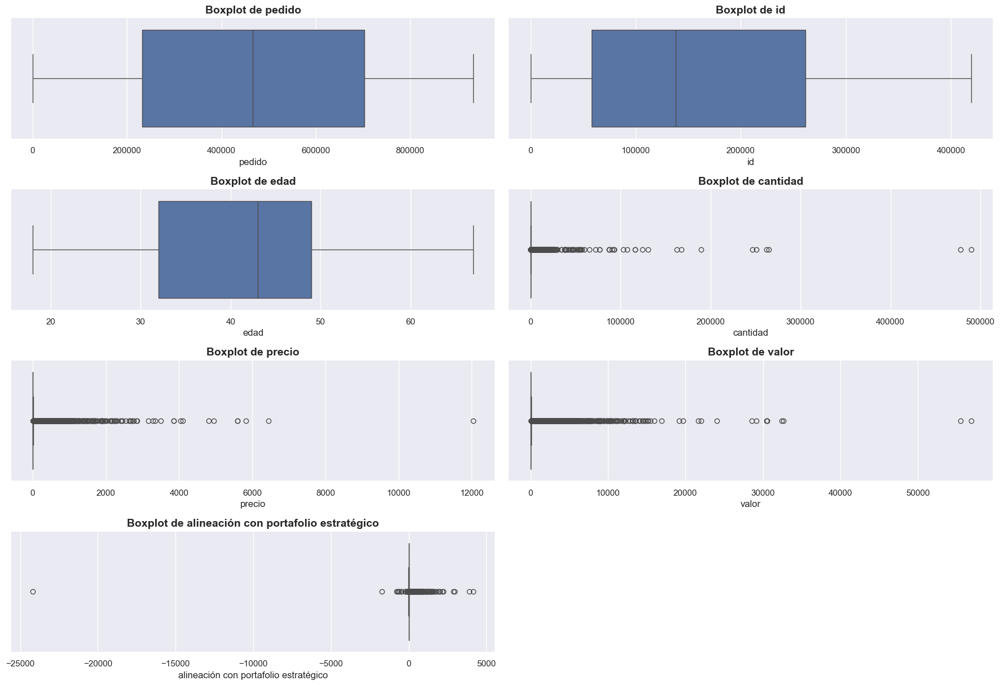

In [11]:
#Diagrama de Cajas y Bigotes por cada variable numerica
plt.figure(figsize=(18, 24))
for i, col in enumerate(var_num, 1):
    plt.subplot(8, 2, i)
    sns.boxplot(x=df_trans_B2C[col])
    plt.title(f'Boxplot de {col}', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

#### Análisis de distribución de variables numércas significativas

<Axes: xlabel='id', ylabel='Count'>

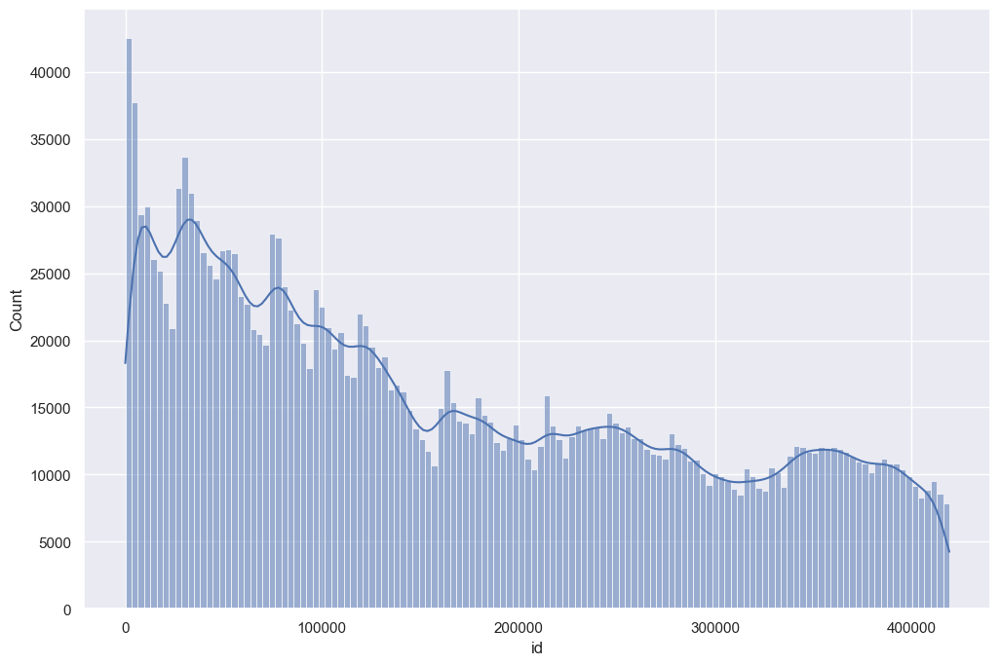

In [12]:
# Histogramas numericos
fig=plt.figure(figsize=(12,8))
sns.histplot(data=df_trans_B2C, x="id", kde=True)

<Axes: xlabel='pedido', ylabel='Count'>

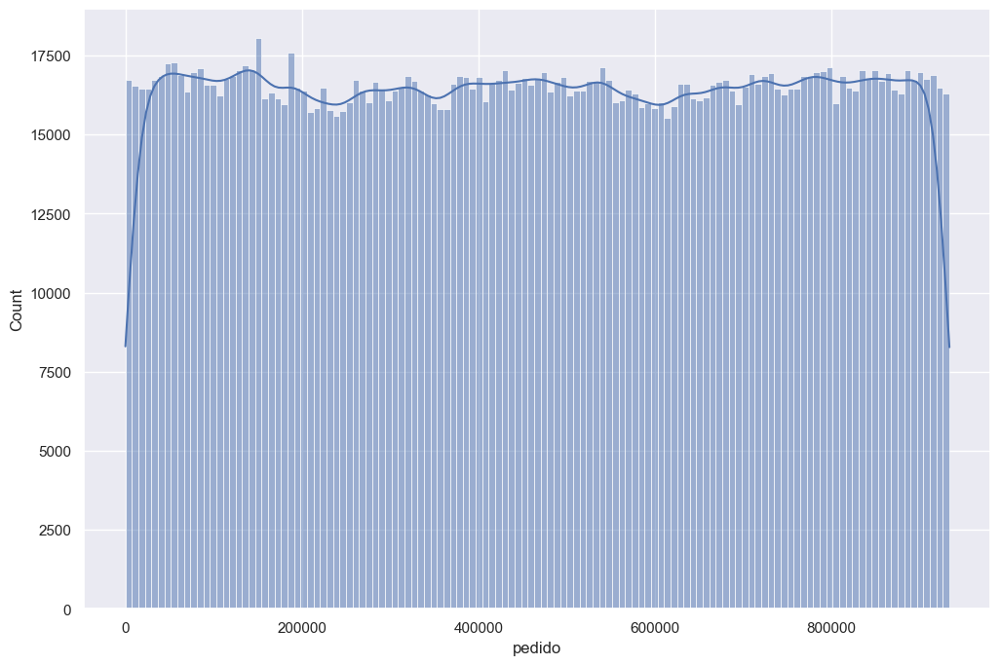

In [13]:
# Histogramas numericos
fig=plt.figure(figsize=(12,8))
sns.histplot(data=df_trans_B2C, x="pedido", kde=True)

<Axes: xlabel='edad', ylabel='Count'>

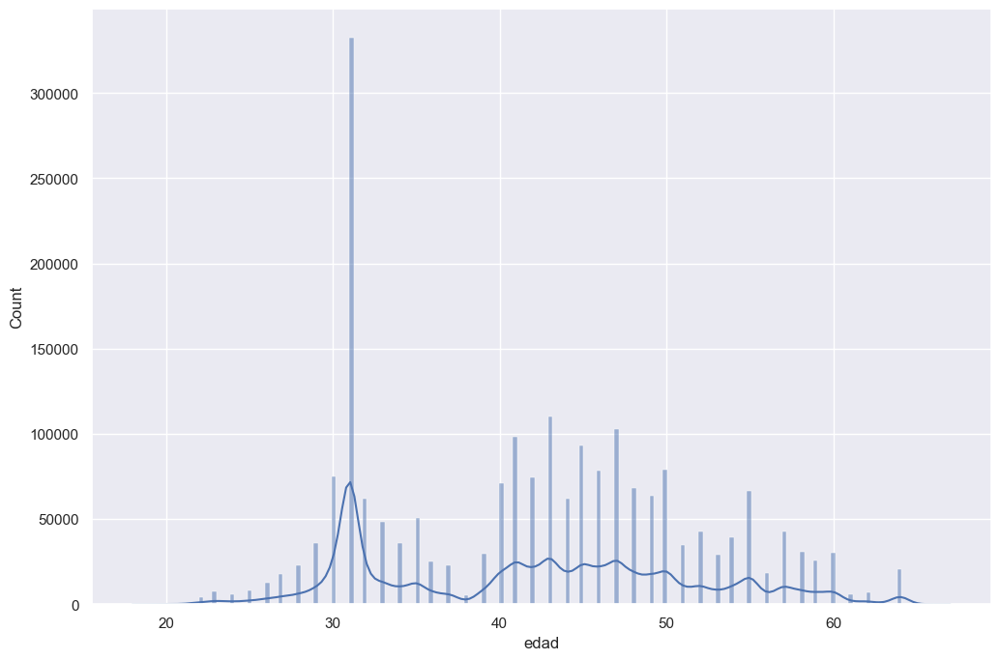

In [14]:
# Histogramas numericos
fig=plt.figure(figsize=(12,8))
sns.histplot(data=df_trans_B2C, x="edad", kde=True)

<Axes: xlabel='precio', ylabel='Count'>

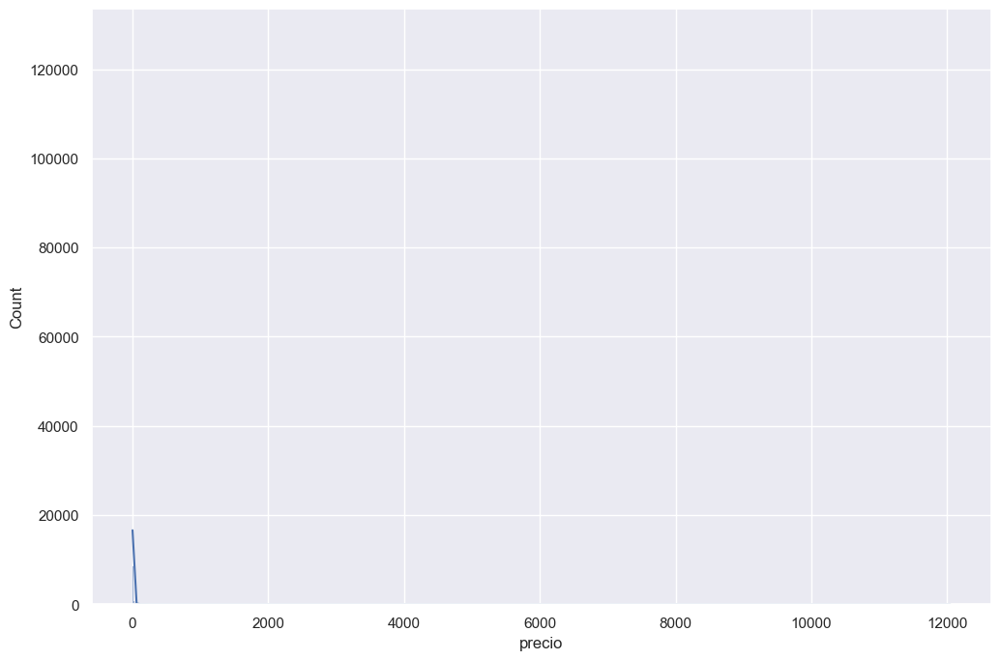

In [15]:
# Histogramas numericos
fig=plt.figure(figsize=(12,8))
sns.histplot(data=df_trans_B2C, x="precio", kde=True)

<Axes: xlabel='valor', ylabel='Count'>

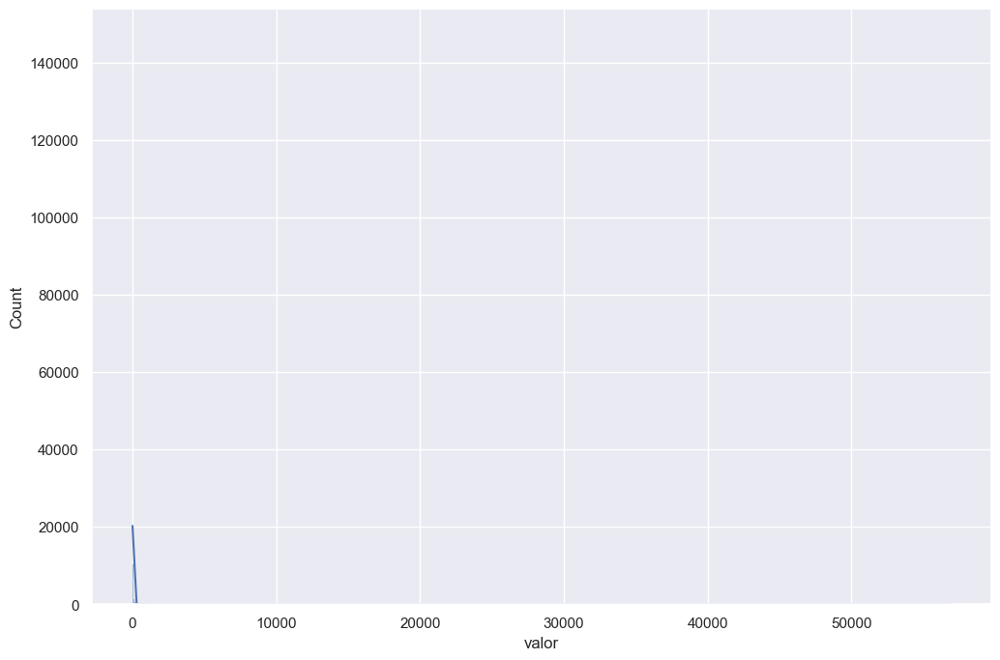

In [16]:
# Histogramas numericos
fig=plt.figure(figsize=(12,8))
sns.histplot(data=df_trans_B2C, x="valor", kde=True)

<Axes: xlabel='alineación con portafolio estratégico', ylabel='Count'>

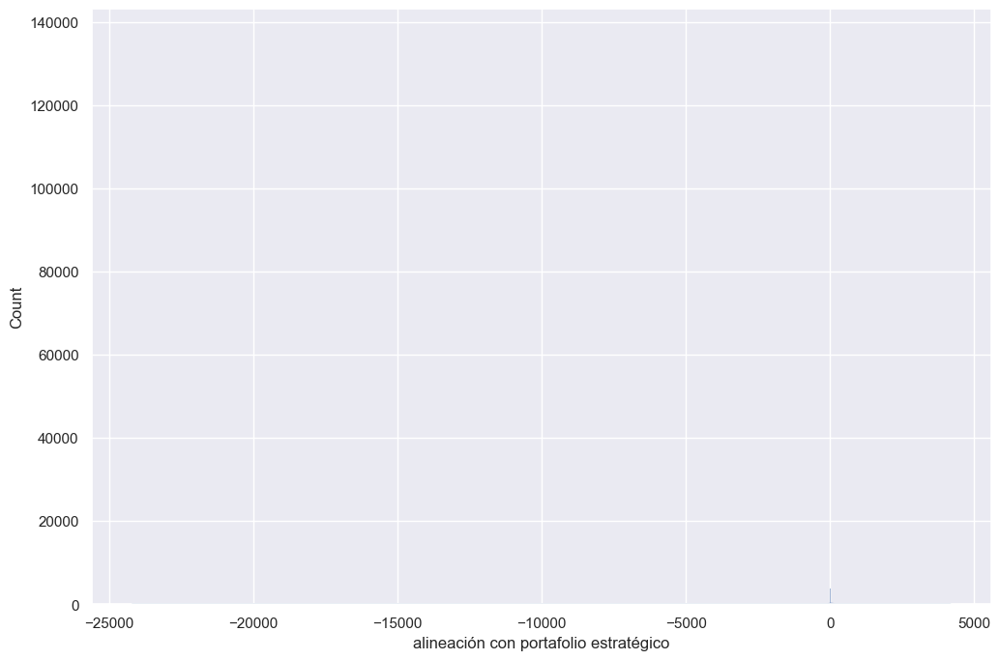

In [17]:
# Histogramas numericos
fig=plt.figure(figsize=(12,8))
sns.histplot(data=df_trans_B2C, x="alineación con portafolio estratégico", kde=True)

In [18]:
# Histogramas numericos
#fig=plt.figure(figsize=(12,8))
#sns.histplot(data=df_trans_B2C, x="cantidad", kde=True)

Text(0.5, 1.0, 'Correlación entre variables numéricas')

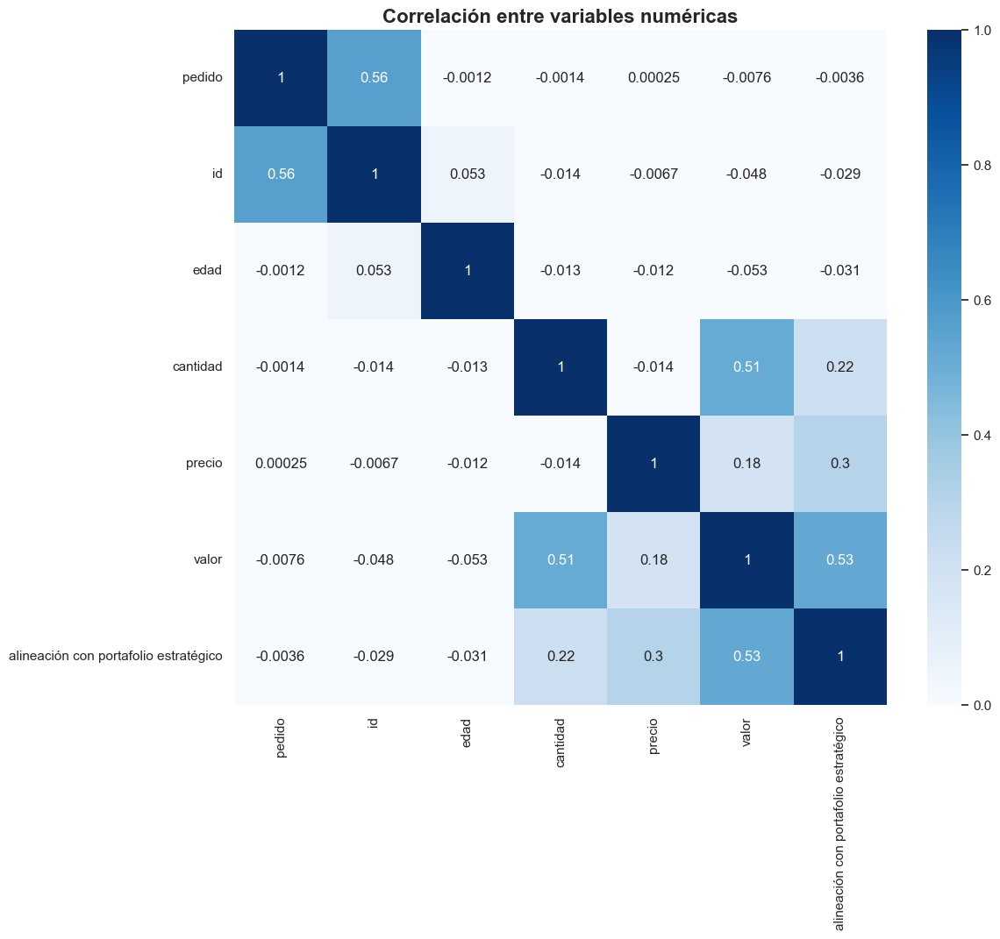

In [19]:
#Análisis de correlación
plt.figure(figsize=(12, 10))
sns.heatmap(df_trans_B2C[var_num].corr(), cmap="Blues", vmin=0, vmax=1, annot=True)
plt.title("Correlación entre variables numéricas", fontsize=16, fontweight='bold')


### 1.2 Atributos Categóricos

In [32]:
var_cat = ['fecha', 'municipio', 'zona', 'asesor', 'punto de venta', 'cluster', 'categoria_macro', 'categoria', 'subcategoria', 'producto', 'color']

In [33]:
#Visualización Variables Categóricas
for col in var_cat:
    print(f"\nDistribución de {col}:")
    print(df_trans_B2C[col].value_counts())


Distribución de fecha:
fecha
1971-06-28    6572
1971-11-11    4871
1971-11-18    4763
1971-07-08    4649
1971-11-25    4528
              ... 
1971-04-06       7
1972-12-25       7
1971-12-25       5
1973-01-01       3
1971-12-24       2
Name: count, Length: 756, dtype: int64

Distribución de municipio:
municipio
CURITI        576380
NATAGAIMA     344983
VILLANUEVA    142303
GUATICA       130383
GIRARDOTA      76950
               ...  
HATO               1
VILLAMARIA         1
MAHATES            1
CALDONO            1
CAREPA             1
Name: count, Length: 808, dtype: int64

Distribución de zona:
zona
SANTANDER          739964
TOLIMA             407991
ANTIOQUIA          224114
LA GUAJIRA         145807
RISARALDA          132904
CUNDINAMARCA       102305
NORTE SANTANDER     59017
BOYACA              45454
HUILA               36290
META                32602
ATLÁNTICO           29473
VALLE               27639
CASANARE            26112
NARIÑO              19021
BOLÍVAR             17

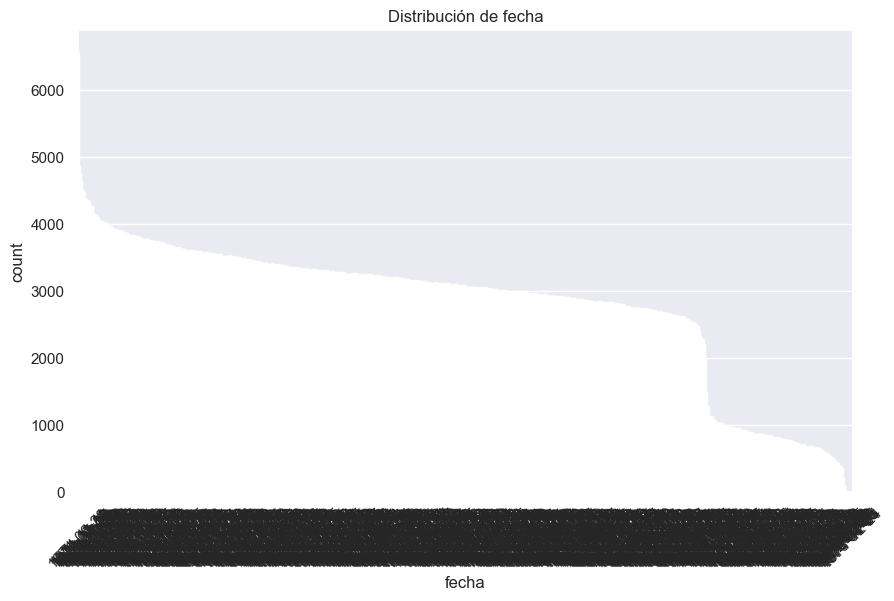

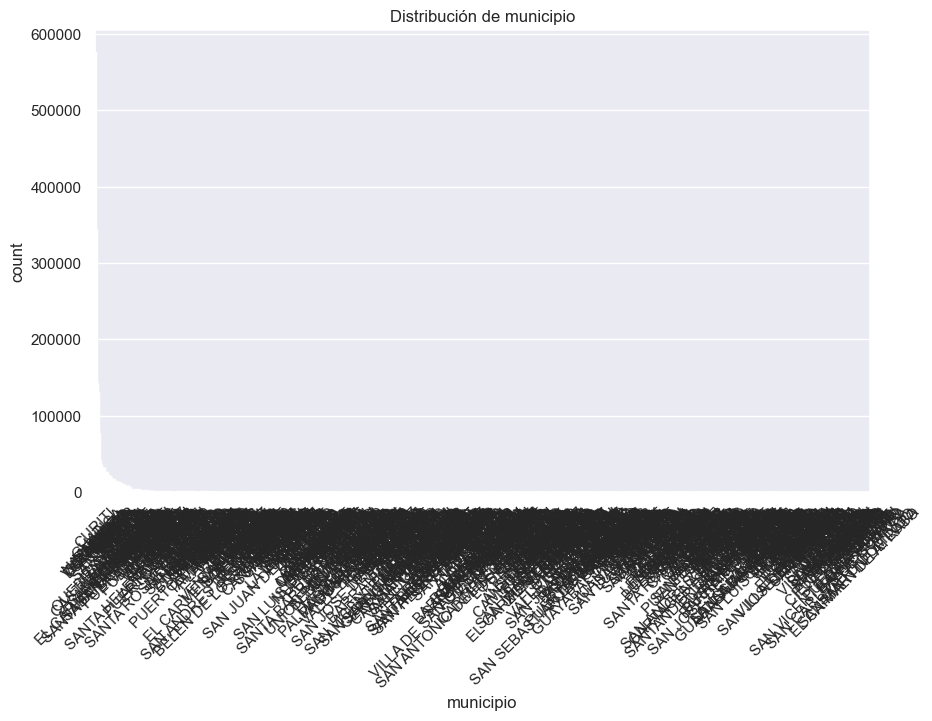

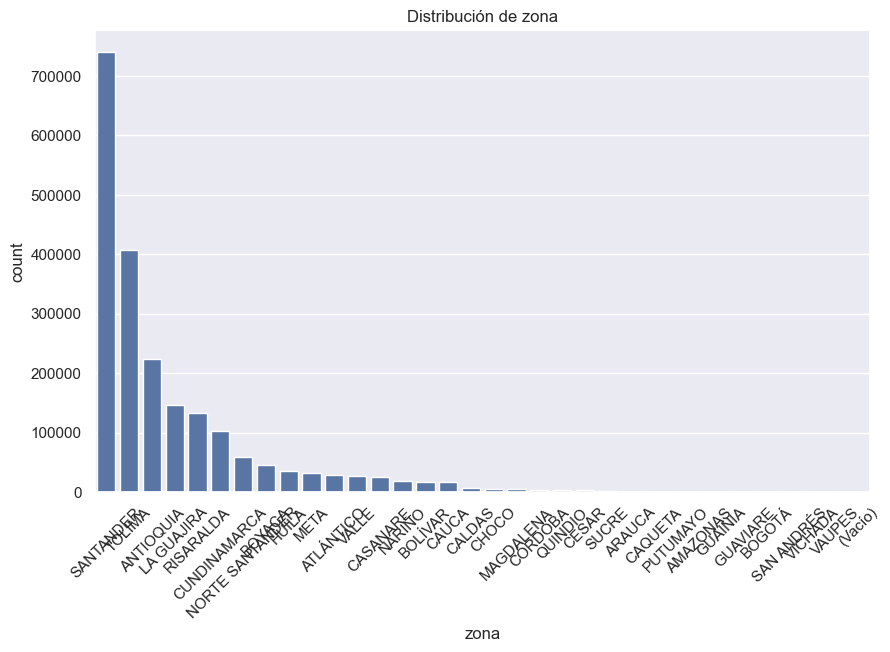

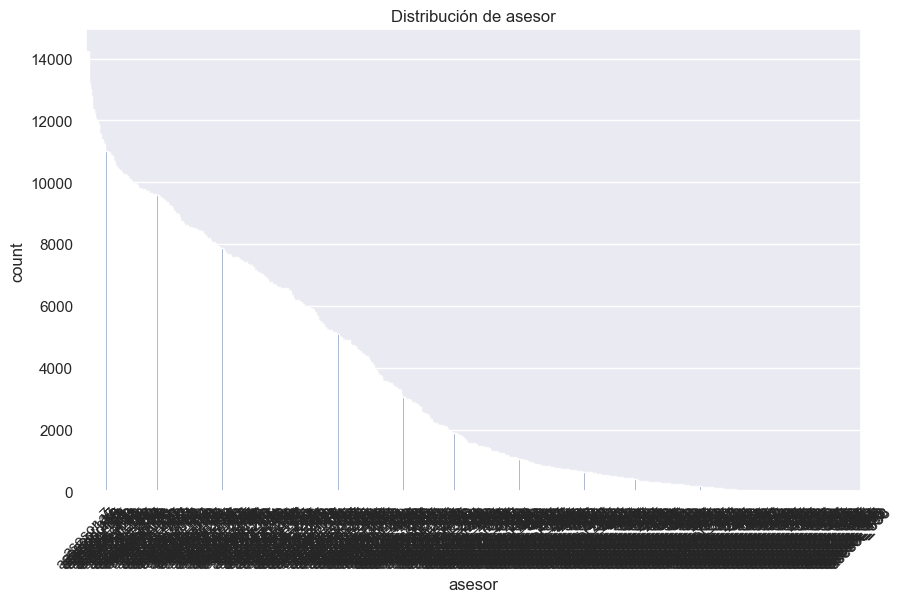

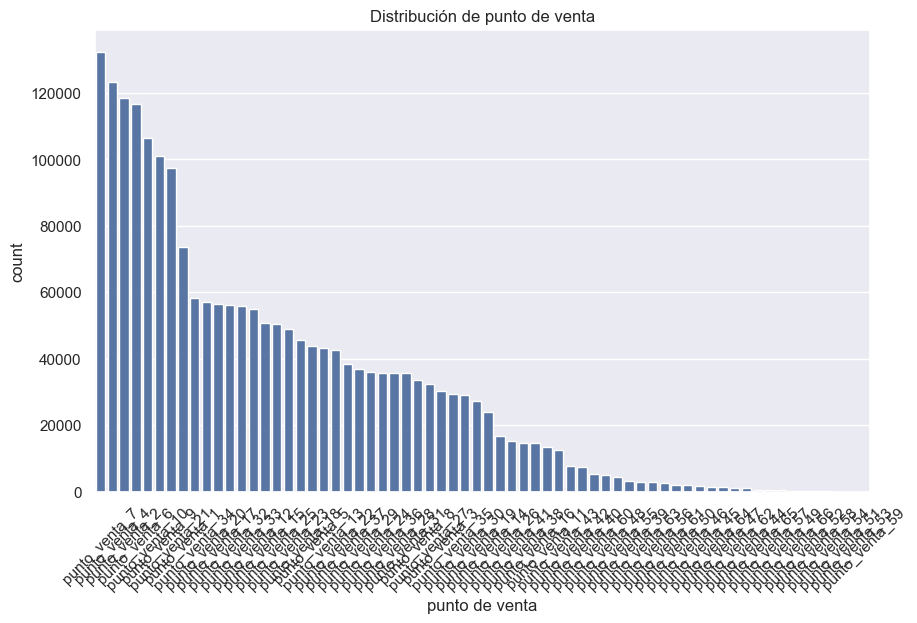

...

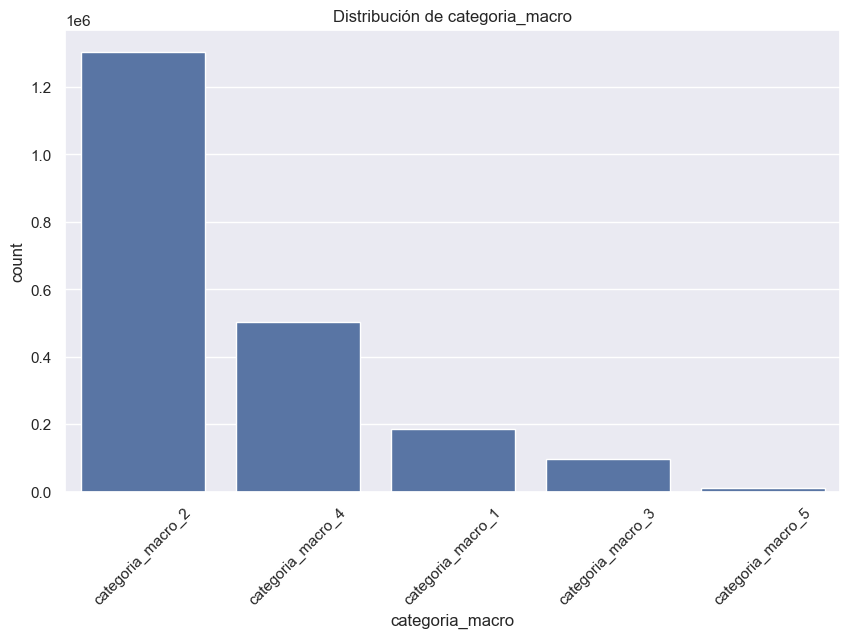

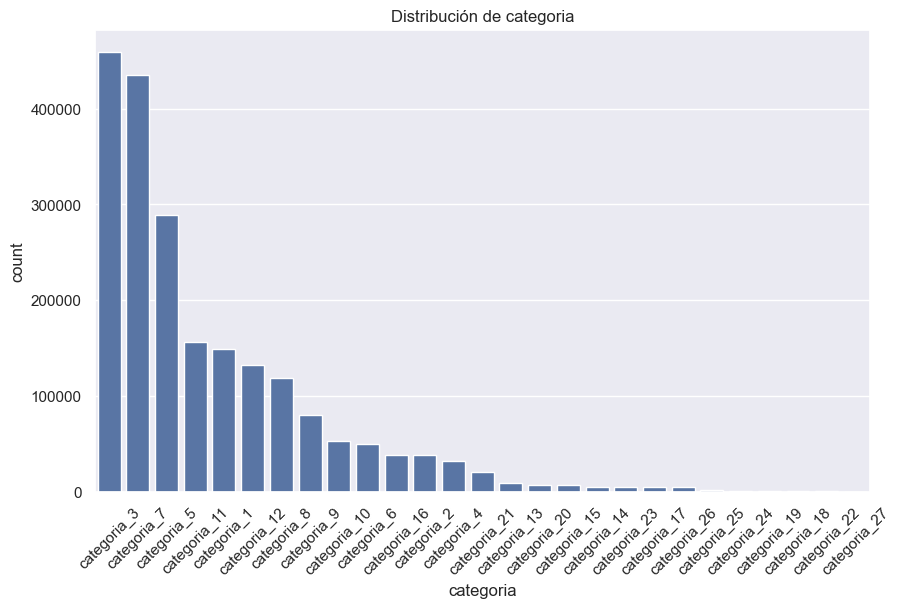

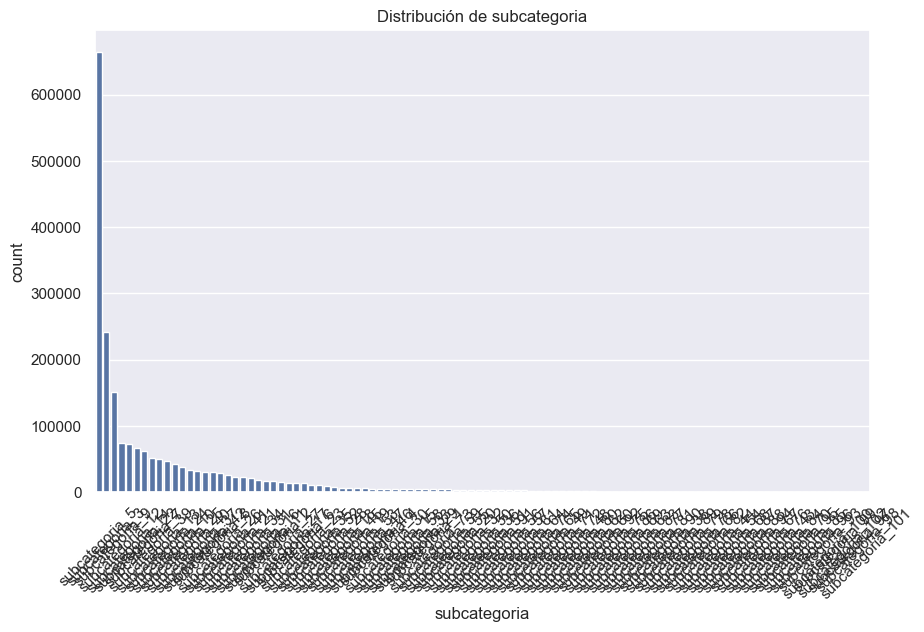

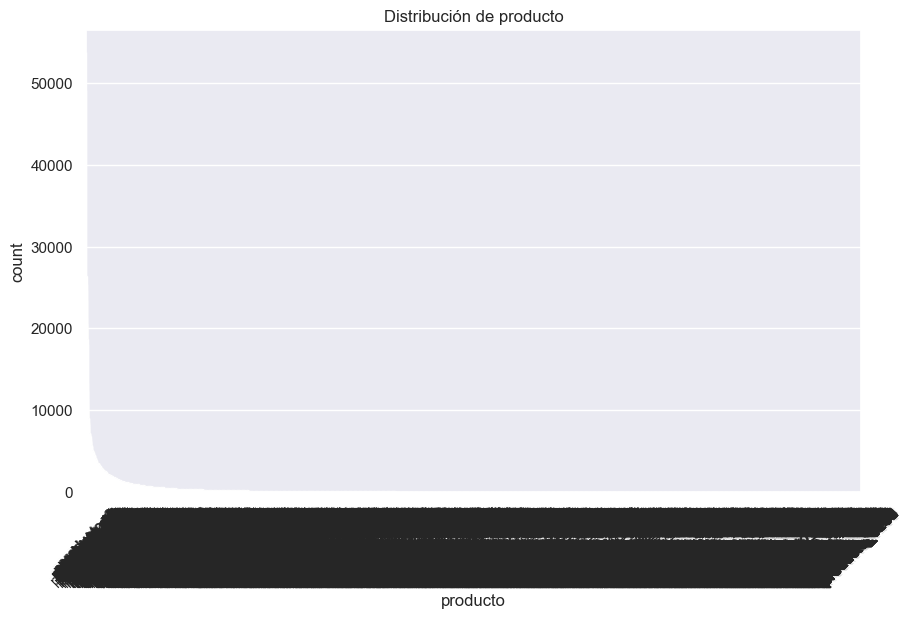

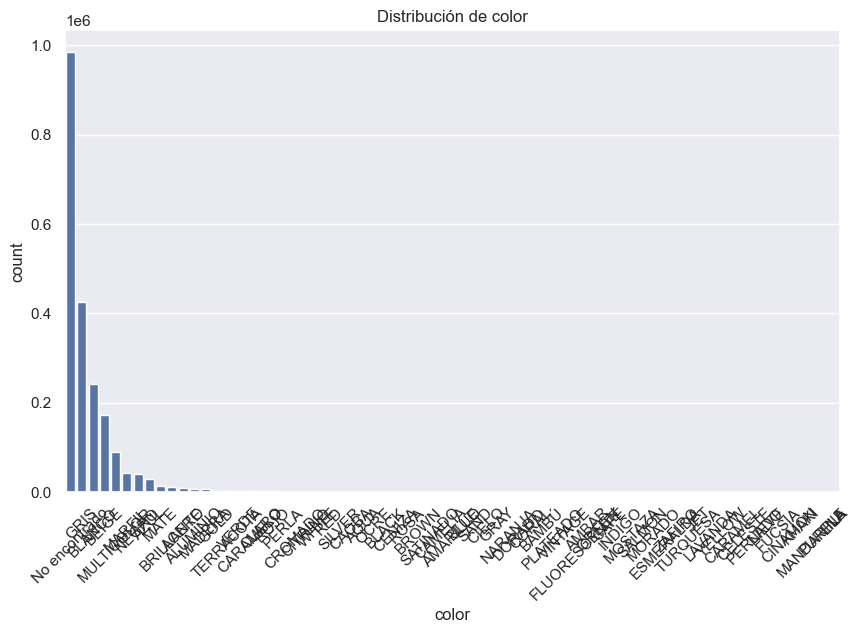

In [22]:
for col in var_cat:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df_trans_B2C, x=col, order=df_trans_B2C[col].value_counts().index)
    plt.title(f'Distribución de {col}')
    plt.xticks(rotation=45)
    plt.show()

### 1.3 Análisis Calidad de Datos

In [11]:
#COMLPETITUD

df_porcentajes = (100*df_trans_B2C.isna().sum()/len(df_trans_B2C)).to_frame()
df_porcentajes.sort_values(0, ascending = False)

,0
precio,0.025288
zona,0.000857
fecha,0.000000
categoria,0.000000
valor,0.000000
cantidad,0.000000
color,0.000000
producto,0.000000
subcategoria,0.000000
categoria_macro,0.000000


In [12]:
#UNICIDAD

duplicados=df_trans_B2C[df_trans_B2C.duplicated()].value_counts()
print(duplicados)

Series([], Name: count, dtype: int64)


Se revisa la unicidad por fila completa ya que no puede haber dos transacciones iguales, sin embargo no se evidencian entras repetidas.

In [13]:
#CONSISTENCIA VARIABLES NUMÉRICAS
df_trans_B2C[var_num].value_counts()

NameError: name 'var_num' is not defined

In [ ]:
#CONSISTENCIA VARIABLES CATEGÓRICAS
df_trans_B2C[var_cat].describe()

,fecha,municipio,zona,asesor,punto de venta,cluster,categoria_macro,categoria,subcategoria,producto,color
count,2099836,2099836,2099818,2099836,2099836,2099836,2099836,2099836,2099836,2099836,2099836
unique,756,808,34,608,66,9,5,27,102,7280,69
top,1971-06-28,CURITI,SANTANDER,asesor_137,punto_venta_7,cluster_tienda_3,categoria_macro_2,categoria_3,subcategoria_5,producto_49,No encontrado
freq,6572,576380,739964,14230,132386,926405,1304967,459528,663877,53825,984853


In [ ]:
#VALIDEZ

date_var = pd.to_datetime(df_trans_B2C['fecha'], errors='coerce')
date_var.isnull().sum()


0

Ya que hay un conjunto de datos fecha se convierte al formato DateTime para darle un manejo adecuado y se revisa su completitud.

### 1.4 Revisión de Correlación

In [28]:
df_trans_B2C[["pedido", "id"]].corr()

,pedido,id
pedido,1.000000,0.562144
id,0.562144,1.000000


In [29]:
df_trans_B2C[["valor", "precio"]].corr()

,valor,precio
valor,1.00000,0.18364
precio,0.18364,1.00000


In [30]:
df_trans_B2C[["cantidad", "valor"]].corr()

,cantidad,valor
cantidad,1.000000,0.514885
valor,0.514885,1.000000


In [31]:
df_trans_B2C[["alineación con portafolio estratégico", "valor"]].corr()

,alineación con portafolio estratégico,valor
alineación con portafolio estratégico,1.000000,0.525386
valor,0.525386,1.000000


No hay correlaciones elevadas en el DF que pudieran representar errores en la manipulación de los datos

## 1+ Optimización de RAM

Antes de preparar y manupilar los datos de la base se realiza una optimización de espacio. Ya que esta base tine más de 2.000.000 de observaciones se implementarán optimizaciones de tipos y posteriormente se guardará la base en formato binario utilizando Feather para volverla así mas liviana y rápida para manipular.

In [15]:
def optimizar_dtypes(df_trans_B2C):
    for col in df_trans_B2C.select_dtypes(include=['int', 'float']).columns:
        df_trans_B2C[col] = pd.to_numeric(df_trans_B2C[col], downcast='unsigned' if (df_trans_B2C[col] >= 0).all() else 'signed')
    
    for col in df_trans_B2C.select_dtypes(include=['object']).columns:
        num_unique = df_trans_B2C[col].nunique()
        num_total = len(df_trans_B2C[col])
        if num_unique / num_total < 0.5:  
            df_trans_B2C[col] = df_trans_B2C[col].astype('category')
    
    return df_trans_B2C


In [16]:
df_trans_B2C = optimizar_dtypes(df_trans_B2C)
df_trans_B2C.info(memory_usage='deep')


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2099836 entries, 0 to 2099835
Data columns (total 18 columns):
 #   Column                                 Dtype   
---  ------                                 -----   
 0   fecha                                  category
 1   pedido                                 uint32  
 2   id                                     uint32  
 3   edad                                   uint8   
 4   municipio                              category
 5   zona                                   category
 6   asesor                                 category
 7   punto de venta                         category
 8   cluster                                category
 9   categoria_macro                        category
 10  categoria                              category
 11  subcategoria                           category
 12  producto                               category
 13  color                                  category
 14  cantidad                          

In [17]:
floats = ['cantidad', 'precio', 'valor', 'alineación con portafolio estratégico']
df_trans_B2C[floats] = df_trans_B2C[floats].astype('float32')


In [18]:
df_trans_B2C.info(memory_usage='deep')


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2099836 entries, 0 to 2099835
Data columns (total 18 columns):
 #   Column                                 Dtype   
---  ------                                 -----   
 0   fecha                                  category
 1   pedido                                 uint32  
 2   id                                     uint32  
 3   edad                                   uint8   
 4   municipio                              category
 5   zona                                   category
 6   asesor                                 category
 7   punto de venta                         category
 8   cluster                                category
 9   categoria_macro                        category
 10  categoria                              category
 11  subcategoria                           category
 12  producto                               category
 13  color                                  category
 14  cantidad                          

Ya se realizaron las estrategias de optimización pertinentes y ahra se guardará en formato binario de PKL

In [19]:

df_trans_B2C.to_pickle("datos_optimizado.pkl")


In [20]:
df = pd.read_pickle("datos_optimizado.pkl")
df.info(memory_usage='deep')


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2099836 entries, 0 to 2099835
Data columns (total 18 columns):
 #   Column                                 Dtype   
---  ------                                 -----   
 0   fecha                                  category
 1   pedido                                 uint32  
 2   id                                     uint32  
 3   edad                                   uint8   
 4   municipio                              category
 5   zona                                   category
 6   asesor                                 category
 7   punto de venta                         category
 8   cluster                                category
 9   categoria_macro                        category
 10  categoria                              category
 11  subcategoria                           category
 12  producto                               category
 13  color                                  category
 14  cantidad                          

Se transformó la base a un archivo binario .pkl para volverla más ligera y manejable

## 2. Prepración de datos

Por el momento no se realizaran transformaciones o modificaciones devariables con respecto a la correlación hasta ver el impacto de eso en l¿el entrenamiento de los modelos. 
Si bien, a partir del profiling es evidentet que existen casos de correlación entre variables como:
alineación con portafolio estratégico y valor o cantidad con precio o categoría con categoría macro.

Si hay valores variables que no se manipulan en esta seccione es debido a que, a partir del permfilamiento de datos, consideramos que cumplen con los requisitos para ser usadas en los modelos.

#### Solución Completitud

**Variable ZONA**
Se eliminan las entradas que no tienen departamento asignado ya que es una variable indispensable para la carecterización del cliente

In [21]:

df = df[df['zona'].notna() & (df['zona'].str.strip() != '')]

#Verificación
original_len = len(df_trans_B2C)
new_len = len(df)
print(f"Filas eliminadas: {original_len - new_len}")


Filas eliminadas: 18


**Variable PRECIO**
Se imputan por la media los valores faltantes de precio. Se considera esta solución ya que los faltantes representan menos de 0.1% de los datos, por ende, su imputación no modificaría la veracidad de los resultados

In [22]:
mediana_precio = df['precio'].mean()
df['precio'] = df['precio'].fillna(mediana_precio)

#Verificación
df['precio'].isna().sum()

0

**Variable VALOR**
Ya que el valor debe ser igual a la cantidad por el precio de producto vendido debe ser choerente con dichas variables. Como se evidencian 872 valores asignados a 0 se recalcula la multiplicación entre cantidad y precio y se le asiga dicho resultado, si este sigue siendo 0 se elimina la entrada ya que se considera como error en la base de datos transaccional

In [23]:
# Reemplazar valores 0
df.loc[df['valor'] == 0, 'valor'] = df['cantidad'] * df['precio']

# Eliminar los que siguen siendo 0
df = df[df['valor'] != 0]


#### Solución Validez

**Variable PRECIO**
Se eliminan los valores negativos de precio. Se considera esta solución ya que los negativos representan menos de 0.1% de los datos, por ende, su eliminación no modificaría la veracidad de los resultados

In [24]:
df = df[df['precio'] >= 0]

#### Solución Skew (Asimetría)

Se aplica la transformación log1p para las columnas asimétricas con valores positivos y yeo-jojnson para la variable con valores negativos

In [25]:
df['log_cantidad'] = np.log1p(df['cantidad'])
df['log_precio'] = np.log1p(df['precio'])
df['log_valor'] = np.log1p(df['valor'])

In [60]:
from sklearn.preprocessing import PowerTransformer

pt = PowerTransformer(method='yeo-johnson')
df['ajustada_alineacion'] = pt.fit_transform(df[['alineación con portafolio estratégico']])

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/numpy/core/_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


In [67]:
import geopandas as gpd

# Path to the GeoJSON file
geojson_path = '/Users/nataliavillegas/Documents/NOVENO SEMESTRE (2025-1)/Corona/Reto_Corona/colombia.geo.json'

# Load the GeoJSON file
geojson = gpd.read_file(geojson_path)

# Display the first few rows of the GeoDataFrame
print(geojson.head())

  DPTO             NOMBRE_DPT          AREA    PERIMETER     HECTARES  \
0   05              ANTIOQUIA  6.335186e+10  1963728.843  6335185.555   
1   08              ATLANTICO  3.360765e+09   240936.172   336076.535   
2   11  SANTAFE DE BOGOTA D.C  1.650948e+09   323322.540   165094.778   
3   13                BOLIVAR  2.614189e+10  1309427.968  2614189.453   
4   15                 BOYACA  2.335258e+10  1364539.911  2335258.246   

                                                                                                                                                                                                  geometry  
0  POLYGON ((-76.3073 8.6193, -76.2981 8.6164, -76.2917 8.6175, -76.2762 8.6088, -76.2629 8.6035, -76.2519 8.5936, -76.2398 8.5896, -76.2271 8.5837, -76.2277 8.5791, -76.2173 8.5716, -76.2162 8.564, ...  
1  POLYGON ((-74.8706 10.3612, -74.8764 10.3433, -74.8816 10.341, -74.8867 10.3295, -74.8954 10.3127, -74.91272 10.2567, -74.9518 10.2743, -74.9576 10.

In [68]:
geojson['NOMBRE_DPT'].unique()

array(['ANTIOQUIA', 'ATLANTICO', 'SANTAFE DE BOGOTA D.C', 'BOLIVAR',
       'BOYACA', 'CALDAS', 'CAQUETA', 'CAUCA', 'CESAR', 'CORDOBA',
       'CUNDINAMARCA', 'CHOCO', 'HUILA', 'LA GUAJIRA', 'MAGDALENA',
       'META', 'NARIÑO', 'NORTE DE SANTANDER', 'QUINDIO', 'RISARALDA',
       'SANTANDER', 'SUCRE', 'TOLIMA', 'VALLE DEL CAUCA', 'ARAUCA',
       'CASANARE', 'PUTUMAYO', 'AMAZONAS', 'GUAINIA', 'GUAVIARE',
       'VAUPES', 'VICHADA',
       'ARCHIPIELAGO DE SAN ANDRES PROVIDENCIA Y SANTA CATALINA'],
      dtype=object)

In [69]:
df_trans_B2C['zona'].value_counts()

zona
SANTANDER          739964
TOLIMA             407991
ANTIOQUIA          224114
LA GUAJIRA         145807
RISARALDA          132904
CUNDINAMARCA       102305
NORTE SANTANDER     59017
BOYACA              45454
HUILA               36290
META                32602
ATLÁNTICO           29473
VALLE               27639
CASANARE            26112
NARIÑO              19021
BOLÍVAR             17924
CAUCA               17842
CALDAS               7434
CHOCO                4949
MAGDALENA            4550
CÓRDOBA              4286
QUINDIO              4022
CESAR                3923
SUCRE                2795
ARAUCA                793
CAQUETA               750
PUTUMAYO              746
AMAZONAS              430
GUAINIA               180
GUAVIARE              177
BOGOTÁ                159
SAN ANDRÉS            117
VICHADA                27
VAUPES                 16
(Vacío)                 5
Name: count, dtype: int64

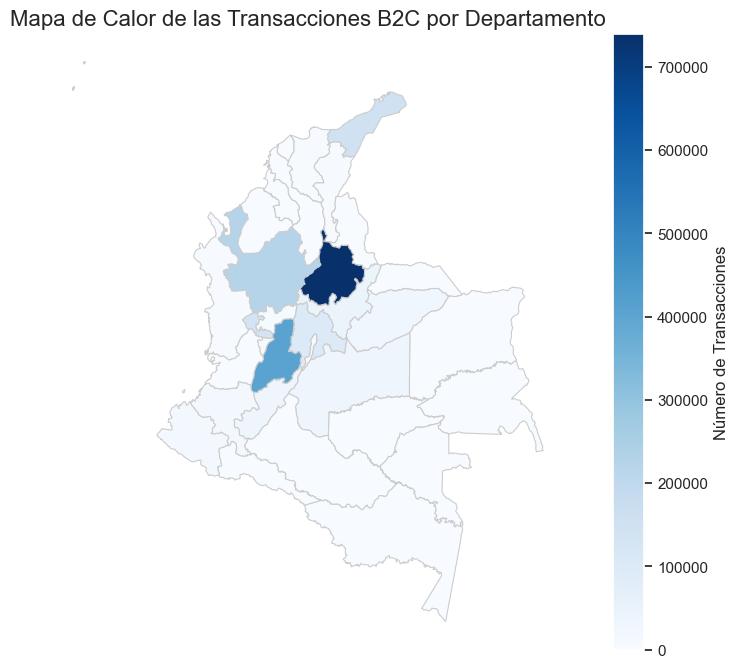

In [71]:
import matplotlib.pyplot as plt
import matplotlib as mpl

fig, ax = plt.subplots(1, 1, figsize=(12, 8))

# Crear el mapa base y obtener el mapeo de colores (norm y cmap)
norm = mpl.colors.Normalize(vmin=geojson['counts'].min(), vmax=geojson['counts'].max())
cmap = plt.cm.Blues

# Dibujar el mapa
geojson.plot(column='counts', cmap=cmap, linewidth=0.8, ax=ax, edgecolor='0.8', legend=False)

# Crear y personalizar la barra de color manualmente
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm._A = []  # necesario para que funcione
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label('Número de Transacciones', fontsize=12)

# Título y diseño
ax.set_title('Mapa de Calor de las Transacciones B2C por Departamento', fontsize=16)
ax.axis('off')

plt.show()


## 3. Selección y nuevas variables

### Variables GEIH

In [15]:
geih = pd.read_csv('base_GEIH_corona.csv', sep = ',')

In [16]:
codigos_dpto = {
    "AMAZONAS": 91, "ANTIOQUIA": 5, "ARAUCA": 81, "ATLÁNTICO": 8, "BOGOTÁ": 11, "BOLÍVAR": 13,
    "BOYACA": 15, "CALDAS": 17, "CAQUETA": 18, "CASANARE": 85, "CAUCA": 19, "CESAR": 20,
    "CHOCÓ": 27, "CÓRDOBA": 23, "CUNDINAMARCA": 25, "GUAINIA": 94, "GUAVIARE": 95,
    "HUILA": 41, "LA GUAJIRA": 44, "MAGDALENA": 47, "META": 50, "NARIÑO": 52,
    "NORTE SANTANDER": 54, "PUTUMAYO": 86, "QUINDIO": 63, "RISARALDA": 66, "SAN ANDRÉS": 88,
    "SANTANDER": 68, "SUCRE": 70, "TOLIMA": 73, "VALLE": 76, "VAUPES": 97, "VICHADA": 99
}

In [17]:
departamentos = pd.DataFrame(list(codigos_dpto.items()), columns=["Departamento", "DPTO"])

In [18]:
geih = pd.merge(geih, departamentos, on="DPTO", how="left")

In [19]:
promedios_geih = geih.groupby("Departamento", as_index=False).agg(
    edad_promedio=("P6040", "mean"),
    ingreso_laboral_promedio=("INGLABO", "mean"),
    total_personas=("CLASE", "count"),
    personas_urbanas=("CLASE", lambda x: (x == 1).sum())
)

In [20]:
# Calcular porcentaje de personas urbanas
promedios_geih["porcentaje_urbano"] = round(100 * promedios_geih["personas_urbanas"] / promedios_geih["total_personas"], 2)

# Eliminar columnas auxiliares 
promedios_geih = promedios_geih.drop(columns=["total_personas", "personas_urbanas"])

In [21]:
df["zona"] = df["zona"].str.strip().str.upper()

# Hacer el merge correctamente
df = pd.merge(df, promedios_geih, how="left", left_on="zona", right_on="Departamento")


In [22]:
df.head(10)

,fecha,pedido,id,edad,municipio,zona,asesor,punto de venta,cluster,categoria_macro,...,valor,alineación con portafolio estratégico,log_cantidad,log_precio,log_valor,ajustada_alineacion,Departamento,edad_promedio,ingreso_laboral_promedio,porcentaje_urbano
0,1971-04-30,2,2,52,EL CARMEN DE CHUCURI,SANTANDER,asesor_2,punto_venta_2,cluster_tienda_2,categoria_macro_1,...,32.880001,2.920320,0.693147,3.522825,3.522825,-0.061772,SANTANDER,37.077072,1.801097e+06,86.88
1,1971-04-30,3,3,31,VILLANUEVA,LA GUAJIRA,asesor_3,punto_venta_2,cluster_tienda_2,categoria_macro_2,...,1.130000,0.117504,1.098612,0.444686,0.756122,-0.201143,LA GUAJIRA,29.862683,1.212095e+06,84.79
2,1971-04-30,4,4,43,VILLANUEVA,LA GUAJIRA,asesor_4,punto_venta_2,cluster_tienda_2,categoria_macro_3,...,8.380000,1.251072,0.693147,2.238580,2.238580,-0.145693,LA GUAJIRA,29.862683,1.212095e+06,84.79
3,1971-04-30,5,5,31,VILLANUEVA,LA GUAJIRA,asesor_5,punto_venta_3,cluster_tienda_3,categoria_macro_2,...,47.990002,3.729024,3.097386,1.184790,3.891616,-0.020477,LA GUAJIRA,29.862683,1.212095e+06,84.79
4,1971-04-30,6,6,49,ARROYOHONDO,BOLÍVAR,asesor_6,punto_venta_4,cluster_tienda_2,categoria_macro_4,...,9.960000,1.223424,0.693147,2.394252,2.394252,-0.147064,BOLÍVAR,34.454450,1.388254e+06,87.09
5,1971-04-30,6,6,49,ARROYOHONDO,BOLÍVAR,asesor_6,punto_venta_4,cluster_tienda_2,categoria_macro_2,...,5.280000,0.397440,1.061256,1.332366,1.837370,-0.187617,BOLÍVAR,34.454450,1.388254e+06,87.09
6,1971-04-30,7,7,50,VILLANUEVA,LA GUAJIRA,asesor_7,punto_venta_2,cluster_tienda_2,categoria_macro_2,...,49.889999,4.434048,2.890927,1.368639,3.929667,0.015785,LA GUAJIRA,29.862683,1.212095e+06,84.79
7,1971-04-30,7,7,50,VILLANUEVA,LA GUAJIRA,asesor_7,punto_venta_2,cluster_tienda_2,categoria_macro_2,...,14.510000,1.289088,1.715598,1.430311,2.741485,-0.143807,LA GUAJIRA,29.862683,1.212095e+06,84.79
8,1971-04-30,8,8,57,CABRERA,CUNDINAMARCA,asesor_8,punto_venta_5,cluster_tienda_2,categoria_macro_1,...,11.500000,1.195776,0.693147,2.525729,2.525729,-0.148434,CUNDINAMARCA,36.749179,1.507069e+06,67.91
9,1971-04-30,9,9,50,VILLANUEVA,LA GUAJIRA,asesor_2,punto_venta_2,cluster_tienda_2,categoria_macro_2,...,6.110000,0.857088,1.098612,1.401183,1.961502,-0.165152,LA GUAJIRA,29.862683,1.212095e+06,84.79


### Dane

In [23]:

ipug = pd.read_excel("dane.xlsx", sheet_name="IPUG", header=None, names=["Departamento", "IPUG"])
gini = pd.read_excel("dane.xlsx", sheet_name="GINI", header=None, names=["Departamento", "GINI"])

ipug["Departamento"] = ipug["Departamento"].str.strip().str.upper()
gini["Departamento"] = gini["Departamento"].str.strip().str.upper()

# 3. Unir IPUG y GINI en una sola tabla
dane_indicadores = pd.merge(ipug, gini, on="Departamento", how="outer")

# 4. Asegurar que 'zona' en tu base está en el mismo formato
df["zona"] = df["zona"].str.strip().str.upper()

# 5. Unir a tu base principal (df), usando zona ↔ Departamento
df = pd.merge(df, dane_indicadores, left_on="zona", right_on="Departamento", how="left")



In [24]:
df.sample(10)

,fecha,pedido,id,edad,municipio,zona,asesor,punto de venta,cluster,categoria_macro,...,log_precio,log_valor,ajustada_alineacion,Departamento_x,edad_promedio,ingreso_laboral_promedio,porcentaje_urbano,Departamento_y,IPUG,GINI
334697,1972-08-01,148411,96062,31,NATAGAIMA,TOLIMA,asesor_203,punto_venta_7,cluster_tienda_3,categoria_macro_4,...,1.713798,1.713798,-0.177180,TOLIMA,38.645737,1.550361e+06,80.70,TOLIMA,770458.0,0.518
2014253,1971-09-01,896888,54835,29,CURITI,SANTANDER,asesor_154,punto_venta_13,cluster_tienda_4,categoria_macro_2,...,0.067659,3.331132,-0.080008,SANTANDER,37.077072,1.801097e+06,86.88,SANTANDER,1056184.0,0.501
176423,1971-08-26,78370,54009,33,FUSAGASUGA,CUNDINAMARCA,asesor_188,punto_venta_27,cluster_tienda_2,categoria_macro_4,...,2.085672,2.714695,-0.113797,CUNDINAMARCA,36.749179,1.507069e+06,67.91,CUNDINAMARCA,1096893.0,0.506
996073,1972-07-28,445816,79060,29,CURITI,SANTANDER,asesor_263,punto_venta_10,cluster_tienda_3,categoria_macro_3,...,0.688135,0.688135,-0.201808,SANTANDER,37.077072,1.801097e+06,86.88,SANTANDER,1056184.0,0.501
1391086,1971-05-30,622246,314738,32,DOLORES,TOLIMA,asesor_95,punto_venta_23,cluster_tienda_3,categoria_macro_2,...,0.104360,3.239854,-0.080357,TOLIMA,38.645737,1.550361e+06,80.70,TOLIMA,770458.0,0.518
802501,1971-02-04,359885,209905,35,CURITI,SANTANDER,asesor_81,punto_venta_6,cluster_tienda_2,categoria_macro_2,...,0.636577,1.843719,-0.180049,SANTANDER,37.077072,1.801097e+06,86.88,SANTANDER,1056184.0,0.501
83496,1972-04-30,37595,26840,47,DON MATIAS,ANTIOQUIA,asesor_195,punto_venta_34,cluster_tienda_3,categoria_macro_4,...,0.993252,0.993252,-0.195816,ANTIOQUIA,38.001476,2.107814e+06,87.64,ANTIOQUIA,1250932.0,0.524
1765657,1971-10-23,788029,25514,48,VILLANUEVA,LA GUAJIRA,asesor_175,punto_venta_2,cluster_tienda_2,categoria_macro_2,...,0.157004,1.340250,-0.190635,LA GUAJIRA,29.862683,1.212095e+06,84.79,LA GUAJIRA,395366.0,0.536
1800621,1971-10-11,803327,20704,47,SANTA LUCIA,ATLÁNTICO,asesor_374,punto_venta_9,cluster_tienda_3,categoria_macro_2,...,1.690096,2.437116,-0.153906,ATLÁNTICO,35.176872,1.538139e+06,88.81,ATLÁNTICO,980735.0,0.486
830968,1972-02-23,372680,215837,31,NATAGAIMA,TOLIMA,asesor_471,punto_venta_7,cluster_tienda_3,categoria_macro_4,...,2.955951,2.955951,-0.085952,TOLIMA,38.645737,1.550361e+06,80.70,TOLIMA,770458.0,0.518


In [25]:
# Departamento duplicado 
columnas_a_eliminar = [
    "Departamento_x", "Departamento_y", 
]

# Elimina solo si existen
df = df.drop(columns=[col for col in columnas_a_eliminar if col in df.columns])

In [26]:
df.head()

,fecha,pedido,id,edad,municipio,zona,asesor,punto de venta,cluster,categoria_macro,...,alineación con portafolio estratégico,log_cantidad,log_precio,log_valor,ajustada_alineacion,edad_promedio,ingreso_laboral_promedio,porcentaje_urbano,IPUG,GINI
0,1971-04-30,2,2,52,EL CARMEN DE CHUCURI,SANTANDER,asesor_2,punto_venta_2,cluster_tienda_2,categoria_macro_1,...,2.920320,0.693147,3.522825,3.522825,-0.061772,37.077072,1.801097e+06,86.88,1056184.0,0.501
1,1971-04-30,3,3,31,VILLANUEVA,LA GUAJIRA,asesor_3,punto_venta_2,cluster_tienda_2,categoria_macro_2,...,0.117504,1.098612,0.444686,0.756122,-0.201143,29.862683,1.212095e+06,84.79,395366.0,0.536
2,1971-04-30,4,4,43,VILLANUEVA,LA GUAJIRA,asesor_4,punto_venta_2,cluster_tienda_2,categoria_macro_3,...,1.251072,0.693147,2.238580,2.238580,-0.145693,29.862683,1.212095e+06,84.79,395366.0,0.536
3,1971-04-30,5,5,31,VILLANUEVA,LA GUAJIRA,asesor_5,punto_venta_3,cluster_tienda_3,categoria_macro_2,...,3.729024,3.097386,1.184790,3.891616,-0.020477,29.862683,1.212095e+06,84.79,395366.0,0.536
4,1971-04-30,6,6,49,ARROYOHONDO,BOLÍVAR,asesor_6,punto_venta_4,cluster_tienda_2,categoria_macro_4,...,1.223424,0.693147,2.394252,2.394252,-0.147064,34.454450,1.388254e+06,87.09,680424.0,0.512


### Variables Calculadas

In [27]:
# 1. Total de productos comprados por cliente (id)
productos_por_cliente = df.groupby("id")["cantidad"].sum().reset_index(name="total_productos")

# 2. Total de dinero gastado por cliente
gasto_por_cliente = df.groupby("id")["valor"].sum().reset_index(name="total_gasto")

# 3. Precio promedio por cliente 
precio_promedio = df.groupby("id").apply(lambda x: x["valor"].sum() / x["cantidad"].sum()).reset_index(name="precio_promedio")

# 4. Número de pedidos distintos por cliente
pedidos_por_cliente = df.groupby("id")["pedido"].nunique().reset_index(name="num_pedidos")

# 5. Gasto promedio 
gasto_promedio = df.groupby(["id", "pedido"])["valor"].sum().groupby("id").mean().reset_index(name="ticket_promedio")

# 6. Cantidad promedio por pedido
cantidad_promedio = df.groupby(["id", "pedido"])["cantidad"].sum().groupby("id").mean().reset_index(name="cantidad_promedio")

# 7. Número de categorías diferentes compradas
categorias_compradas = df.groupby("id")["categoria_macro"].nunique().reset_index(name="categorias_diferentes")



variables_calculadas = (
    productos_por_cliente
    .merge(gasto_por_cliente, on="id")
    .merge(precio_promedio, on="id")
    .merge(pedidos_por_cliente, on="id")
    .merge(gasto_promedio, on="id")
    .merge(cantidad_promedio, on="id")
    .merge(categorias_compradas, on="id")
  
)

df = df.merge(variables_calculadas, on="id", how="left")


C:\Users\volpi\AppData\Local\Temp\ipykernel_21520\758092650.py:8: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  precio_promedio = df.groupby("id").apply(lambda x: x["valor"].sum() / x["cantidad"].sum()).reset_index(name="precio_promedio")


In [28]:
df.sample(5)

,fecha,pedido,id,edad,municipio,zona,asesor,punto de venta,cluster,categoria_macro,...,porcentaje_urbano,IPUG,GINI,total_productos,total_gasto,precio_promedio,num_pedidos,ticket_promedio,cantidad_promedio,categorias_diferentes
951452,1971-07-12,426205,234426,60,NATAGAIMA,TOLIMA,asesor_152,punto_venta_4,cluster_tienda_2,categoria_macro_3,...,80.70,770458.0,0.518,2.000000,70.380005,35.190002,2,35.190002,1.000000,2
1209845,1972-06-11,540128,252886,35,GUAVATA,SANTANDER,asesor_74,punto_venta_2,cluster_tienda_2,categoria_macro_4,...,86.88,1056184.0,0.501,705.559998,312.150024,0.442415,3,104.049995,235.186661,2
65581,1971-04-08,29712,11706,31,GUATICA,RISARALDA,asesor_49,punto_venta_9,cluster_tienda_3,categoria_macro_2,...,87.94,1049362.0,0.471,13650.089844,14034.059570,1.028130,63,222.762863,216.668091,4
1779752,1971-10-19,794119,373136,31,VILLANUEVA,LA GUAJIRA,asesor_197,punto_venta_33,cluster_tienda_3,categoria_macro_4,...,84.79,395366.0,0.536,2.000000,25.680000,12.840000,2,12.840000,1.000000,1
767899,1971-02-18,343841,202434,54,CURITI,SANTANDER,asesor_83,punto_venta_10,cluster_tienda_3,categoria_macro_2,...,86.88,1056184.0,0.501,88.110001,771.900024,8.760639,2,385.950012,44.055000,1


### Conteo Nacional - Edificaciones en Construcción

In [29]:
import pandas as pd
df_CN = pd.read_excel('Conteo_Nacional.xlsx', sheet_name='Edificios')

In [30]:
def quitar_tildes(texto):
    if isinstance(texto, str):
        reemplazos = str.maketrans('áéíóúÁÉÍÓÚ', 'aeiouAEIOU')
        return texto.translate(reemplazos)
    return texto

df['municipio_normalizado'] = df['municipio'].apply(lambda x: quitar_tildes(str(x)).strip().lower())
df_CN['municipio_normalizado'] = df_CN['Municipio'].apply(lambda x: quitar_tildes(str(x)).strip().lower())

df = df.merge(
    df_CN[['municipio_normalizado', 'Total de edificaciones en obra']],
    on='municipio_normalizado',
    how='left'
)

df.drop(columns=['municipio_normalizado'], inplace=True)


Debidio a la cantidad de Nan´s, fueron reemplazados por ceros para que la falta de información de ciertos municipios no perjudique la realización y entrenamiento de los modelos por desarrollar.

In [31]:
df['Total de edificaciones en obra'] = df['Total de edificaciones en obra'].fillna(0)


# 4. Preparacion de datos (de nuevo) para emplear clustering

In [68]:
df_modifiedB2C = df.copy()

## 4.1 Completitud

In [69]:
# Op1 Se ven el numero de valores nulos
porcentajeIncompletitudAtributo =  (100 * df_modifiedB2C.isnull().sum() / df_modifiedB2C.shape[0]).sort_values(ascending=False)
pd.DataFrame({
    "Atributo": porcentajeIncompletitudAtributo.index,
    "Completitud (%)": 100 - porcentajeIncompletitudAtributo.values,
    "Incompletitud (%)": porcentajeIncompletitudAtributo.values,
    "Numero de registros con nulos": porcentajeIncompletitudAtributo.values * df_modifiedB2C.shape[0] / 100
})

,Atributo,Completitud (%),Incompletitud (%),Numero de registros con nulos
0,edad_promedio,99.807142,0.192858,4954.0
1,porcentaje_urbano,99.807142,0.192858,4954.0
2,ingreso_laboral_promedio,99.807142,0.192858,4954.0
3,GINI,99.999805,0.000195,5.0
4,IPUG,99.999805,0.000195,5.0
5,fecha,100.000000,0.000000,0.0
6,pedido,100.000000,0.000000,0.0
7,id,100.000000,0.000000,0.0
8,edad,100.000000,0.000000,0.0
9,zona,100.000000,0.000000,0.0


In [70]:
df_modifiedB2C.isnull().sum()

fecha                                       0
pedido                                      0
id                                          0
edad                                        0
municipio                                   0
zona                                        0
asesor                                      0
punto de venta                              0
cluster                                     0
categoria_macro                             0
categoria                                   0
subcategoria                                0
producto                                    0
color                                       0
cantidad                                    0
precio                                      0
valor                                       0
alineación con portafolio estratégico       0
log_cantidad                                0
log_precio                                  0
log_valor                                   0
ajustada_alineacion               

In [71]:
nan_rows = df[df.isna().any(axis=1)]
print(nan_rows.to_string())

              fecha  pedido      id  edad            municipio     zona      asesor  punto de venta           cluster    categoria_macro     categoria     subcategoria       producto          color     cantidad      precio        valor  alineación con portafolio estratégico  log_cantidad  log_precio  log_valor  ajustada_alineacion  edad_promedio  ingreso_laboral_promedio  porcentaje_urbano      IPUG   GINI  total_productos  total_gasto  precio_promedio  num_pedidos  ticket_promedio  cantidad_promedio  categorias_diferentes  Total de edificaciones en obra
138      1971-04-30      49      47    57           ALTO BAUDO    CHOCO   asesor_30   punto_venta_1  cluster_tienda_1  categoria_macro_1   categoria_2   subcategoria_2    producto_75  No encontrado     1.000000    7.710000     7.710000                               0.684288      0.693147    2.164472   2.164472            -0.173631            NaN                       NaN                NaN  416159.0  0.589        23.650000    50.689999

Tratamiento de problemas de completitud en la base de datos

In [72]:
# Filas con NaNs en alguna de las columnas relevantes
filtros = df_modifiedB2C[
    df_modifiedB2C[['edad_promedio', 'ingreso_laboral_promedio', 'porcentaje_urbano']].isna().any(axis=1)
]

# Mostrar los departamentos correspondientes
departamentos_con_nans = filtros['zona'].unique()
print("Departamentos con NaNs:", departamentos_con_nans)


Departamentos con NaNs: ['CHOCO' '(VACÍO)']


In [73]:
df_modifiedB2C.isnull().sum()

fecha                                       0
pedido                                      0
id                                          0
edad                                        0
municipio                                   0
zona                                        0
asesor                                      0
punto de venta                              0
cluster                                     0
categoria_macro                             0
categoria                                   0
subcategoria                                0
producto                                    0
color                                       0
cantidad                                    0
precio                                      0
valor                                       0
alineación con portafolio estratégico       0
log_cantidad                                0
log_precio                                  0
log_valor                                   0
ajustada_alineacion               

Se imputan los datos faltanes del chocó por los datos del putumayo por su similitud socioeconómica

In [74]:

columnas_a_imputar = ['edad_promedio', 'ingreso_laboral_promedio', 'porcentaje_urbano']

promedios_putumayo = df_modifiedB2C[df_modifiedB2C['zona'] == 'PUTUMAYO'][columnas_a_imputar].mean()


for col in columnas_a_imputar:
    df_modifiedB2C.loc[
        (df_modifiedB2C['zona'] == 'CHOCO') & (df_modifiedB2C[col].isna()),
        col
    ] = promedios_putumayo[col]


In [75]:
df_modifiedB2C.isnull().sum()

fecha                                    0
pedido                                   0
id                                       0
edad                                     0
municipio                                0
zona                                     0
asesor                                   0
punto de venta                           0
cluster                                  0
categoria_macro                          0
categoria                                0
subcategoria                             0
producto                                 0
color                                    0
cantidad                                 0
precio                                   0
valor                                    0
alineación con portafolio estratégico    0
log_cantidad                             0
log_precio                               0
log_valor                                0
ajustada_alineacion                      0
edad_promedio                            5
ingreso_lab

In [76]:
df_modifiedB2C.dropna(inplace=True)
df_modifiedB2C.reset_index(drop=True, inplace=True)  


In [77]:
df_modifiedB2C.isnull().sum().sum()

np.int64(0)

In [78]:
# Detectar si hay valores "Vacío" o "(Vacío)" en cada columna
columnas_con_vacio = df_modifiedB2C.apply(lambda col: col.astype(str).str.contains(r'\(?Vacío\)?', na=False))
columnas_con_vacio = columnas_con_vacio.any()

# Mostrar solo las columnas que contienen al menos un "Vacío"
print("Columnas con 'Vacío' o '(Vacío)':")
print(columnas_con_vacio[columnas_con_vacio == True].index.tolist())


Columnas con 'Vacío' o '(Vacío)':
[]


In [79]:
df_modifiedB2C.sample(2)

,fecha,pedido,id,edad,municipio,zona,asesor,punto de venta,cluster,categoria_macro,...,IPUG,GINI,total_productos,total_gasto,precio_promedio,num_pedidos,ticket_promedio,cantidad_promedio,categorias_diferentes,Total de edificaciones en obra
2092569,1972-11-13,762418,135189,41,CUCUNUBA,CUNDINAMARCA,asesor_168,punto_venta_10,cluster_tienda_3,categoria_macro_2,...,1096893.0,0.506,1870.919922,1918.150024,1.025244,9,213.127762,207.879990,2,0.0
895100,1973-01-08,316290,181238,33,ARGELIA,CAUCA,asesor_110,punto_venta_22,cluster_tienda_3,categoria_macro_2,...,595819.0,0.512,494.480011,1205.410034,2.437732,6,200.901672,82.413338,4,0.0


Se ha corregido el problema de completitud que surgió al enriquecer la base

## 4.2 Unicidad

In [80]:
# Duplicados
registrosDuplicados = df.duplicated()
totalDuplicados = registrosDuplicados.sum()
totalRegistros = df.shape[0]
porcentajeDuplicados = 100.0 * totalDuplicados / totalRegistros
print(f"Se cuenta con {totalDuplicados} registros duplicados ({porcentajeDuplicados:.2f}%)")


Se cuenta con 14914 registros duplicados (0.58%)


In [81]:
duplicated_rows = df[df.duplicated()]
print(duplicated_rows.to_string())

              fecha  pedido      id  edad         municipio             zona      asesor  punto de venta           cluster    categoria_macro     categoria     subcategoria       producto          color      cantidad       precio        valor  alineación con portafolio estratégico  log_cantidad  log_precio  log_valor  ajustada_alineacion  edad_promedio  ingreso_laboral_promedio  porcentaje_urbano       IPUG   GINI  total_productos   total_gasto  precio_promedio  num_pedidos  ticket_promedio  cantidad_promedio  categorias_diferentes  Total de edificaciones en obra
24       1971-04-30       8       8    57           CABRERA     CUNDINAMARCA    asesor_8   punto_venta_5  cluster_tienda_2  categoria_macro_1   categoria_1   subcategoria_7    producto_10         BLANCO      1.000000    11.500000    11.500000                               1.195776      0.693147    2.525729   2.525729            -0.148434      36.749179              1.507069e+06              67.91  1096893.0  0.506       216.05

Tratamiento de problemas de duplicidad en los datos

In [82]:
# Eliminar duplicados exactos
df_modifiedB2C.drop_duplicates(inplace=True)

In [83]:
# Revisión
registrosDuplicados = df_modifiedB2C.duplicated()
totalDuplicados = registrosDuplicados.sum()
totalRegistros = df_modifiedB2C.shape[0]
porcentajeDuplicados = 100.0 * totalDuplicados / totalRegistros
print(f"Se cuenta con {totalDuplicados} registros duplicados ({porcentajeDuplicados:.2f}%)")

Se cuenta con 0 registros duplicados (0.00%)


Se solucionó el problema de duplicados

## 4.3 Codificar variables categóricas

In [84]:
variables_cate = df_modifiedB2C.select_dtypes(include=['object']).columns
variables_cate

Index(['zona'], dtype='object')

In [85]:
df_encoded_B2C = pd.get_dummies(df_modifiedB2C, columns = variables_cate, drop_first=False)
df_encoded_B2C.head()

,fecha,pedido,id,edad,municipio,asesor,punto de venta,cluster,categoria_macro,categoria,...,zona_PUTUMAYO,zona_QUINDIO,zona_RISARALDA,zona_SAN ANDRÉS,zona_SANTANDER,zona_SUCRE,zona_TOLIMA,zona_VALLE,zona_VAUPES,zona_VICHADA
0,1971-04-30,2,2,52,EL CARMEN DE CHUCURI,asesor_2,punto_venta_2,cluster_tienda_2,categoria_macro_1,categoria_2,...,False,False,False,False,True,False,False,False,False,False
1,1971-04-30,3,3,31,VILLANUEVA,asesor_3,punto_venta_2,cluster_tienda_2,categoria_macro_2,categoria_3,...,False,False,False,False,False,False,False,False,False,False
2,1971-04-30,3,3,31,VILLANUEVA,asesor_3,punto_venta_2,cluster_tienda_2,categoria_macro_2,categoria_3,...,False,False,False,False,False,False,False,False,False,False
3,1971-04-30,3,3,31,VILLANUEVA,asesor_3,punto_venta_2,cluster_tienda_2,categoria_macro_2,categoria_3,...,False,False,False,False,False,False,False,False,False,False
4,1971-04-30,3,3,31,VILLANUEVA,asesor_3,punto_venta_2,cluster_tienda_2,categoria_macro_2,categoria_3,...,False,False,False,False,False,False,False,False,False,False


## 4.4 Escalar los datos

Para poder escalar los datos se eliminará la columna fecha y se reemplazará por los valores e información relevante de la fecha en columnas distintas

In [86]:

df_encoded_B2C['fecha'] = pd.to_datetime(df_encoded_B2C['fecha'])

df_encoded_B2C['año'] = df_encoded_B2C['fecha'].dt.year
df_encoded_B2C['mes'] = df_encoded_B2C['fecha'].dt.month
df_encoded_B2C['día'] = df_encoded_B2C['fecha'].dt.day
df_encoded_B2C['trimestre'] = df_encoded_B2C['fecha'].dt.quarter


df_encoded_B2C.drop(columns='fecha', inplace=True)


In [87]:
numeric_columns = df_encoded_B2C.select_dtypes(include=['int64', 'float64']).columns

In [88]:
standard_scalerB2C = StandardScaler()
scaledB2C = standard_scalerB2C.fit_transform(df_encoded_B2C[numeric_columns])
scaledB2C

array([[ 0.41969016,  0.65700962,  0.45739893, ...,  0.04339418,
         0.98552912, -0.19676856],
       [-1.7252014 , -1.45429125, -0.0039664 , ..., -0.15165624,
        -1.03725423, -0.22470455],
       [-1.7252014 , -1.45429125, -0.0039664 , ..., -0.15165624,
        -1.03725423,  0.02671935],
       ...,
       [-0.43749383,  0.76493505, -0.27548762, ..., -0.11619253,
        -1.03725423, -0.08502461],
       [ 0.88606598, -0.24176506, -0.90682965, ..., -0.15165624,
        -1.03725423, -0.25264053],
       [ 0.88606598, -0.24176506, -0.90682965, ..., -0.15165624,
        -1.03725423, -0.25264053]])

In [93]:

df_scaledB2C = pd.DataFrame(scaledB2C, columns=numeric_columns, index=df_encoded_B2C.index)


variables_categoricas = df_encoded_B2C.drop(columns=numeric_columns)

# Concatenar el escalado con las categóricas
df_final = pd.concat([df_scaledB2C, variables_categoricas], axis=1)


In [94]:
df_final.sample(5)

,edad_promedio,ingreso_laboral_promedio,porcentaje_urbano,IPUG,GINI,num_pedidos,categorias_diferentes,Total de edificaciones en obra,pedido,id,...,zona_SANTANDER,zona_SUCRE,zona_TOLIMA,zona_VALLE,zona_VAUPES,zona_VICHADA,año,mes,día,trimestre
1085258,0.419690,0.657010,0.457399,0.744550,-0.344265,-0.133924,-1.037254,-0.085025,396486,177172,...,True,False,False,False,False,False,1972,2,3,1
1915425,-1.725201,-1.454291,-0.003966,-1.544532,0.553765,-0.116193,0.985529,0.194335,698145,229959,...,False,False,False,False,False,False,1971,11,27,4
1410496,1.072350,0.728992,0.691393,0.720919,-1.114004,-0.151656,-1.037254,-0.168833,513732,274531,...,False,False,False,False,False,False,1971,6,3,2
814753,0.886066,-0.241765,-0.906830,-0.245209,0.091921,-0.062997,0.985529,-0.252641,296900,179368,...,False,False,True,False,False,False,1973,1,29,1
1247427,0.419690,0.657010,0.457399,0.744550,-0.344265,0.025662,1.996921,-0.085025,454996,77857,...,True,False,False,False,False,False,1972,7,20,3


# 5. Agrupacion de datos

## 5.1 KMeans

### 5.1.1 Seleccion de hiperparametros

#### 5.1.1.1 Metodo del codo

In [95]:
def elbow_plot(X, model, k_min=2, k_max=10):
    """
    Genera la gráfica para el método del codo usando KMeans
    
    Parametros:
    X : np.array
        El arreglo con los datos
    model : str
        "kmeans" o "kmedoids", especifica el modelo a entrenar.
    k_min : int
        Valor mínimo para k
    k_max : int
        Valor máximo para k
    """
    inertias = []
    for i in range(k_min, k_max+1):
        if model == "kmeans":
            model_k = KMeans(n_clusters=i, max_iter=300, n_init=10, random_state=0)
        else:
            model_k = KMedoids(n_clusters=i, max_iter=300, random_state=0)
        # Entrenamos el modelo
        model_k.fit(X)
        # Almacenamos el valor de inercia
        inertias.append(model_k.inertia_)
    
    # Graficamos los valores de inercia
    plt.plot(range(k_min,k_max+1), inertias, marker='o')
    plt.xlabel('Número de clusters')
    plt.ylabel('Inercia')
    plt.grid()
    plt.show()

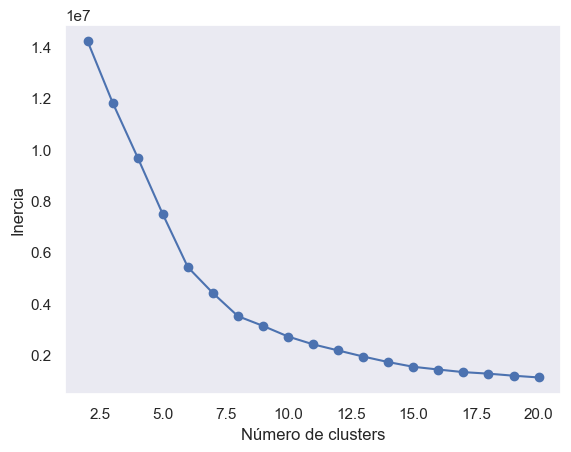

In [96]:
elbow_plot(df_scaledB2C, "kmeans", 2, 20)

#### 5.1.1.2 Metodo de la Silueta (Valor global)

In [97]:
def silhouette_plot(X, model, k_min=2, k_max=5):
    """
    Genera la gráfica con el coeficiente de la silueta
    
    Parametros:
    X : np.array
        El arreglo con los datos
    model : str
        "kmeans" o "kmedoids", especifica el modelo a entrenar.
    k_min : int
        Valor mínimo para k
    k_max : int
        Valor máximo para k
    """
    scores = []
    for i in range(k_min, k_max+1):
        if model == "kmeans":
            model_k = KMeans(n_clusters=i, max_iter=300, n_init=10, random_state=0)
        else:
            model_k = KMedoids(n_clusters=i, max_iter=300, random_state=0)
        # Entrenamos el modelo
        model_k.fit(X)
        # Almacenamos el coeficiente de la silueta
        score = silhouette_score(X, model_k.labels_)
        scores.append(score)
    
    # Graficamos los valores del coeficiente de la silueta
    plt.plot(range(k_min,k_max+1), scores, marker='o')
    plt.xlabel('Número de clusters')
    plt.ylabel('Silhouette Score')
    plt.grid()
    plt.show()

In [ ]:
silhouette_plot(df_scaledB2C, "kmeans", 2, 20)

#### 5.1.1.3 Mejor modelo

In [101]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.8)  # retain 90% variance
df_pca = pca.fit_transform(df_scaledB2C)

In [103]:
### Se ingresa en el n_clusters el k encontrado previamente de los analisis
km_model = KMeans(n_clusters=9, n_init="auto", random_state=0)
km_model.fit(df_pca)

KMeans(n_clusters=9, random_state=0)

In [ ]:
# Se calcula el valor de la silueta para evaluar que tan bueno es el modelo
clusters = km_model.predict(df_pca)
print(f"Coeficiente de Silueta: {silhouette_score(df_scaledB2C, km_model.labels_)}")


#### 3.1.1.4 Grafica PCA

In [ ]:
pca = PCA(n_components=2)
clients_pca = pca.fit_transform(df_scaledB2C)
plt.figure(figsize=(10, 8))
plt.scatter(clients_pca[:, 0], clients_pca[:, 1], c=clusters, cmap='viridis', s=20)
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Agrupamiento de Clientes con K-Means')
plt.grid(True)
plt.show()

#### 3.1.1.5 Interpretacion de los grupos

In [ ]:
# Cuantos datos se tiene por cluster
labels = km_model.labels_
indexes, values = np.unique(labels, return_counts=True)

{indexes[i]: values[i] for i in range(len(indexes))}

In [ ]:
rects = plt.bar(indexes, values)
plt.xlabel('Cluster')
plt.ylabel('Número de datos')
plt.xticks(indexes)

In [ ]:
# inverse_transform(data) retorna un arreglo de Numpy

data_original = standard_scalerB2C.inverse_transform(df_scaledB2C)
# Utilizaremos las columnas de la variable data para construir un DataFrame
data_original = pd.DataFrame(data_original, columns=df_scaledB2C.columns)
# Si añadimos una columna con el resultado de la agrupación, 
# podremos interpretar el resultado fácilmente
data_original['Cluster'] = km_model.labels_
data_original

#### 3.1.1.6 Interpretacion de los centroides

In [ ]:
centroids_array = km_model.cluster_centers_
centroids_original = standard_scalerB2C.inverse_transform(centroids_array)
centroids_original

In [ ]:
centroids = pd.DataFrame(centroids_original, columns=df_scaledB2C.columns)
centroids

In [ ]:
clusters = km_model.fit_predict(df_scaledB2C)

clusters_series = pd.Series(clusters)
clusters_series.replace({7: 'otros', 8: 'otros', 0: 'otros', 4: 'otros'}, inplace=True)
cluster_counts = clusters_series.value_counts()

colors = sns.color_palette('pastel')

plt.pie(cluster_counts, 
        labels=cluster_counts.index, 
        colors=colors, 
        autopct='%1.1f%%', 
        pctdistance=0.6, 
        startangle=90)

plt.title('Distribución de instancias por clúster para K Means')
plt.show()

## 4.3 Codificar variables categóricas

# Cotizaciones B2C

## 1. Entendimiento y Perfilamiento de datos

In [67]:
df_cot_B2C.shape

(180387, 11)

In [68]:
df_cot_B2C.sample(10)

,cotizacion,estado_cotizacion,id,fecha_creacion,fecha_modificacion,categoria_macro,categoria,producto,cantidad,precio,valor
86429,4433796.0,Cotización Ganada,259202,1972-07-03 08:54:51.113,1972-07-03 09:07:21,categoria_macro_4,categoria_11,producto_27,1.0,0.364572,0.364572
145341,4276581.0,Cotización Expirada,8947,1972-11-25 16:40:09.527,1972-11-26 08:16:49,categoria_macro_1,categoria_1,producto_1779,1.0,6.587143,6.587143
76913,8402425.0,Cotización Ganada,186111,1973-01-21 08:09:24.137,1973-01-21 08:28:24,categoria_macro_4,categoria_11,producto_30,2.0,1.744143,3.488287
15255,7074034.0,Cotización Expirada,126224,1972-08-07 12:57:03.643,1972-08-21 12:33:40,categoria_macro_3,categoria_13,producto_4875,1.0,12.337429,12.337429
12353,7793148.0,Cotización Ganada,86446,1972-08-16 17:03:28.647,1972-08-16 17:05:36,categoria_macro_4,categoria_10,producto_2713,1.0,52.088143,52.088143
145783,4795417.0,Cotización Ganada,355402,1972-11-27 07:34:11.203,1972-11-27 07:44:02,categoria_macro_1,categoria_1,producto_4722,1.0,2.618286,2.618286
169084,2947208.0,Cotización Ganada,344694,1972-10-21 10:15:59.377,1972-10-21 10:58:52,categoria_macro_4,categoria_11,producto_188,1.0,7.863143,7.863143
71981,4676087.0,Cotización Ganada,187083,1973-01-18 15:46:55.010,1973-01-18 16:12:30,categoria_macro_4,categoria_11,producto_27,1.0,0.372857,0.372857
153497,2164627.0,Cotización Expirada,120287,1972-10-05 08:40:10.603,1972-10-07 08:12:08,categoria_macro_4,categoria_11,producto_102,1.0,4.420428,4.420428
52914,4034618.0,Abierta,189932,1972-12-21 10:05:53.233,1972-12-27 08:01:59,categoria_macro_3,categoria_14,producto_4966,1.0,62.134572,62.134572


In [69]:
df_cot_B2C.head()

,cotizacion,estado_cotizacion,id,fecha_creacion,fecha_modificacion,categoria_macro,categoria,producto,cantidad,precio,valor
0,1381861.0,Cotización Ganada,91587,1972-08-05 12:25:47.700,1972-08-05 13:37:35,categoria_macro_4,categoria_9,producto_524,1.0,34.957429,34.957429
1,1381861.0,Cotización Ganada,91587,1972-08-05 12:25:47.700,1972-08-05 13:37:35,categoria_macro_4,categoria_11,producto_124,1.0,2.262000,2.262000
2,1381861.0,Cotización Ganada,91587,1972-08-05 12:25:47.700,1972-08-05 13:37:35,categoria_macro_4,categoria_10,producto_5085,1.0,40.600000,40.600000
3,1381861.0,Cotización Ganada,91587,1972-08-05 12:25:47.700,1972-08-05 13:37:35,categoria_macro_4,categoria_11,producto_188,1.0,7.863143,7.863143
4,1381864.0,Cotización Ganada,93623,1972-08-05 14:36:57.273,1972-08-05 15:06:26,categoria_macro_4,categoria_10,producto_391,1.0,63.932571,63.932571


In [70]:
df_cot_B2C.describe()

,cotizacion,id,cantidad,precio,valor
count,1.803870e+05,180387.000000,180387.000000,180387.000000,180387.000000
mean,5.078489e+06,201958.376563,30.337815,18.897239,36.905377
std,2.330758e+06,131817.410108,1128.197335,43.212077,884.640566
min,1.330102e+06,9.000000,0.000000,0.000000,0.000000
25%,3.014320e+06,90794.500000,1.000000,1.702715,2.850289
50%,4.625202e+06,156082.000000,1.000000,6.844000,9.495428
75%,7.073812e+06,357146.000000,2.000000,19.214571,27.657714
max,9.660005e+06,429016.000000,438000.000000,3087.911715,366411.673079


In [71]:
df_cot_B2C.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180387 entries, 0 to 180386
Data columns (total 11 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   cotizacion          180387 non-null  float64
 1   estado_cotizacion   180387 non-null  object 
 2   id                  180387 non-null  int64  
 3   fecha_creacion      180387 non-null  object 
 4   fecha_modificacion  180387 non-null  object 
 5   categoria_macro     180387 non-null  object 
 6   categoria           180387 non-null  object 
 7   producto            180387 non-null  object 
 8   cantidad            180387 non-null  float64
 9   precio              180387 non-null  float64
 10  valor               180387 non-null  float64
dtypes: float64(4), int64(1), object(6)
memory usage: 15.1+ MB


In [72]:
# Para categorizar las variables en su tipo de dato
categorical_cols = df_cot_B2C.select_dtypes(include=["object"]).columns
numeric_cols = df_cot_B2C.select_dtypes(include=["number"]).columns
datetime_cols = df_cot_B2C.select_dtypes(include=["datetime"]).columns

# Imprimir las variables categóricas
print("Variables categóricas:")
print(", ".join(categorical_cols))

# Imprimir las variables numéricas
print("\nVariables numéricas:")
print(", ".join(numeric_cols))

# Imprimir las variables de fecha
print("\nVariables de fecha:")
print(", ".join(datetime_cols))

Variables categóricas:
estado_cotizacion, fecha_creacion, fecha_modificacion, categoria_macro, categoria, producto

Variables numéricas:
cotizacion, id, cantidad, precio, valor

Variables de fecha:



### 1.1 Atributos Numéricos

In [73]:
numeric_cols = df_cot_B2C.select_dtypes(include=["number"]).columns
numeric_cols

Index(['cotizacion', 'id', 'cantidad', 'precio', 'valor'], dtype='object')

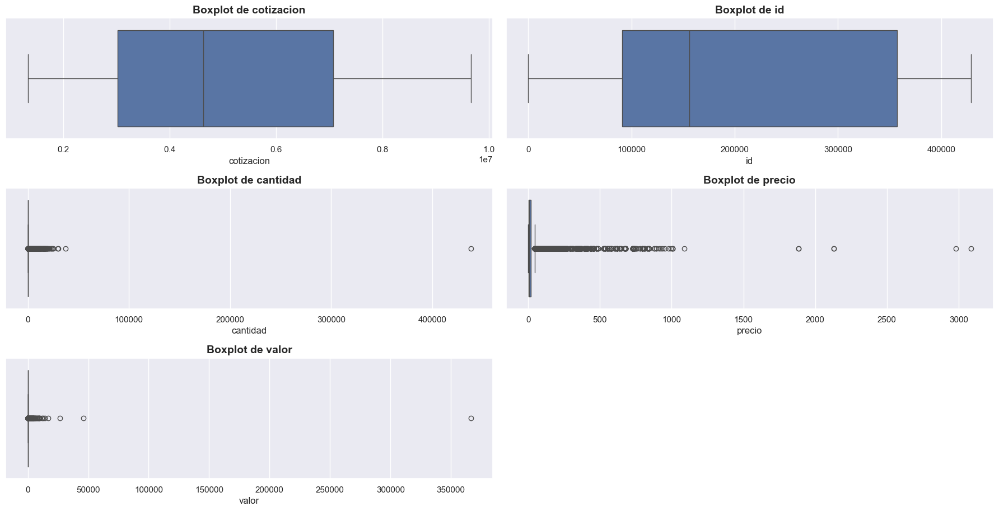

In [74]:
# BoxPlot de las variables numéricas
plt.figure(figsize=(18, 24))
for i, col in enumerate(numeric_cols, 1):
    plt.subplot(8, 2, i)
    sns.boxplot(x=df_cot_B2C[col])
    plt.title(f'Boxplot de {col}', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

<Axes: xlabel='cotizacion', ylabel='Count'>

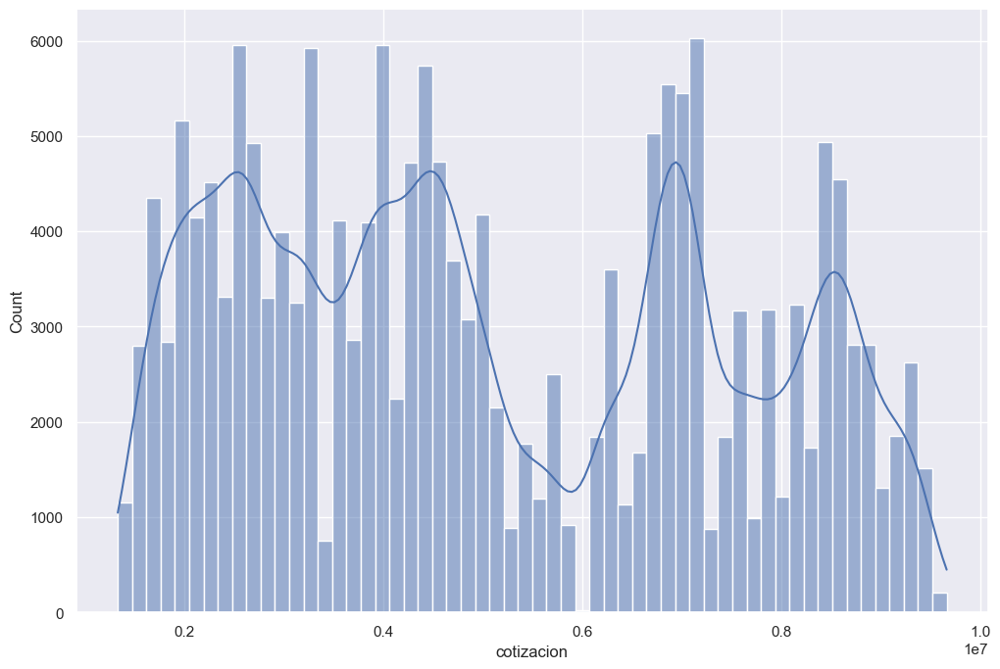

In [75]:
# Histogramas numericos
fig=plt.figure(figsize=(12,8))
sns.histplot(data=df_cot_B2C, x="cotizacion", kde=True)

<Axes: xlabel='id', ylabel='Count'>

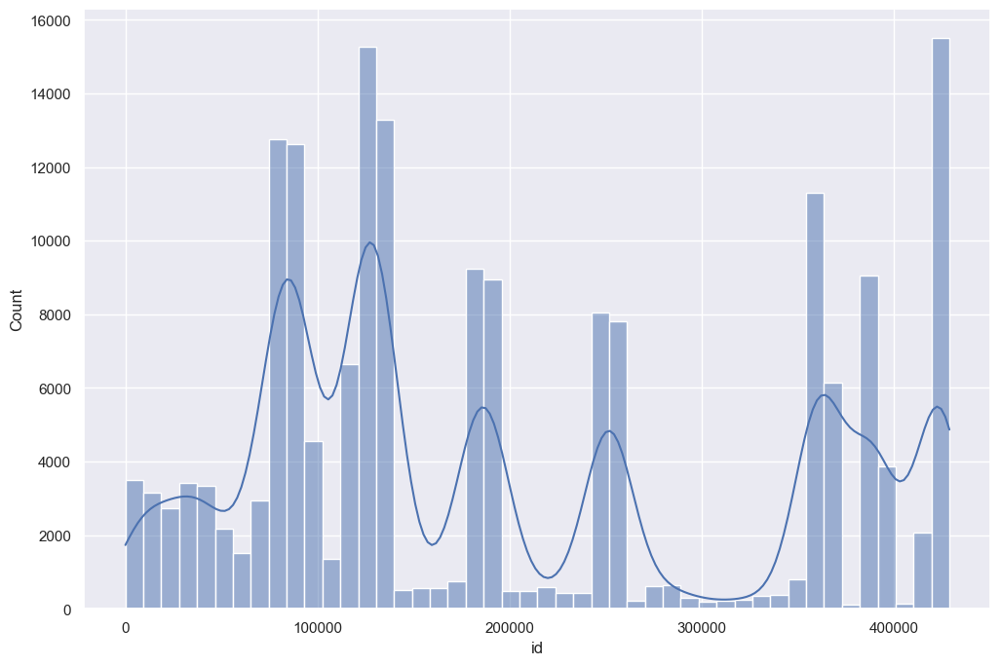

In [76]:
# Histogramas numericos
fig=plt.figure(figsize=(12,8))
sns.histplot(data=df_cot_B2C, x="id", kde=True)

In [77]:
# Histogramas numericos
#fig=plt.figure(figsize=(12,8))
#sns.histplot(data=df_cot_B2C, x="cantidad", kde=True)

<Axes: xlabel='precio', ylabel='Count'>

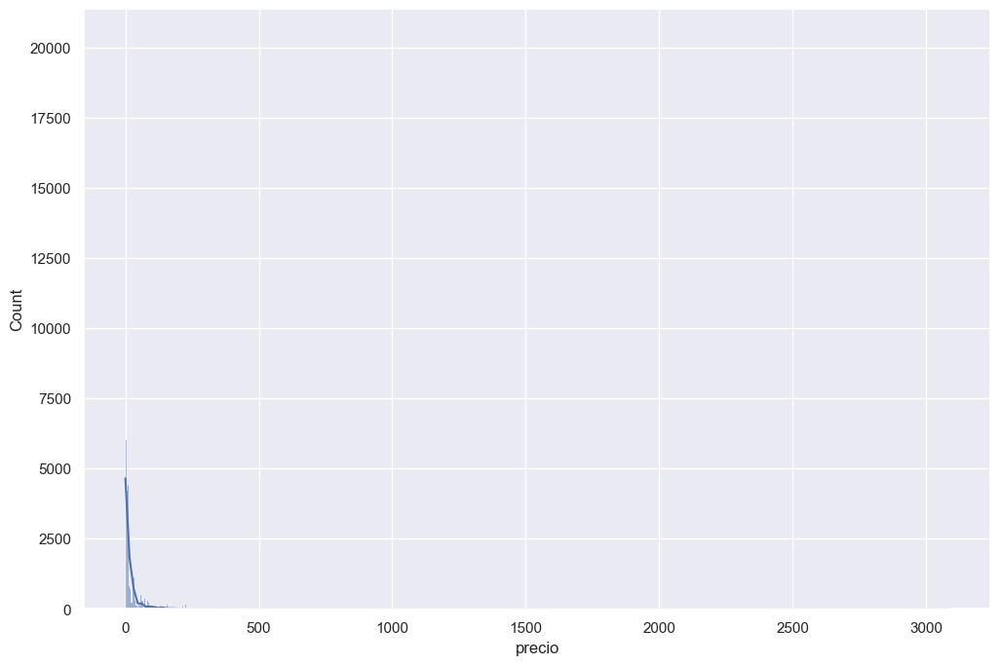

In [78]:
# Histogramas numericos
fig=plt.figure(figsize=(12,8))
sns.histplot(data=df_cot_B2C, x="precio", kde=True)

<Axes: xlabel='valor', ylabel='Count'>

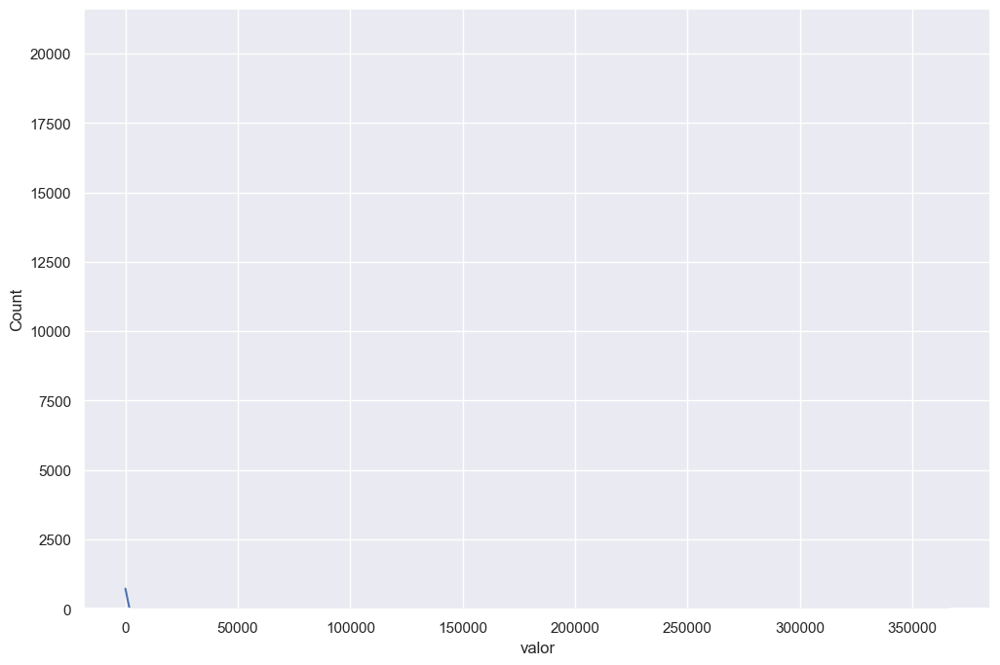

In [79]:
# Histogramas numericos
fig=plt.figure(figsize=(12,8))
sns.histplot(data=df_cot_B2C, x="valor", kde=True)

Text(0.5, 1.0, 'Correlación entre variables numéricas')

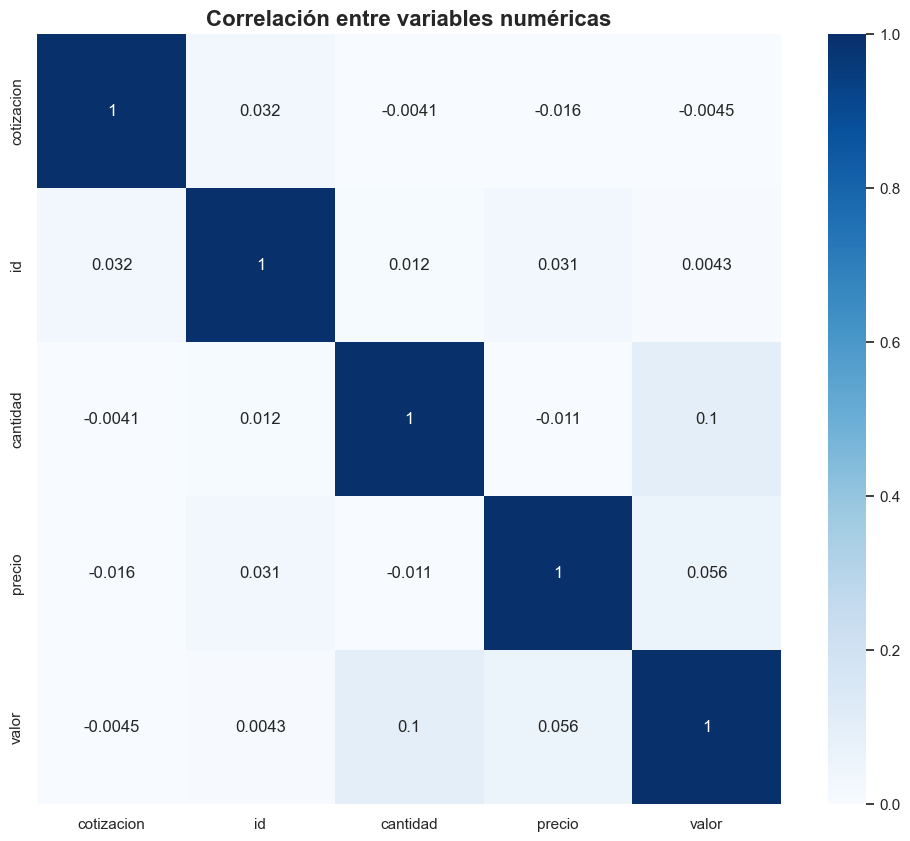

In [80]:
#Análisis de correlación
plt.figure(figsize=(12, 10))
sns.heatmap(df_cot_B2C[numeric_cols].corr(), cmap="Blues", vmin=0, vmax=1, annot=True)
plt.title("Correlación entre variables numéricas", fontsize=16, fontweight='bold')

### 1.2 Atributos Categóricos

In [81]:
categorical_cols = ['estado_cotizacion',
       'categoria_macro', 'categoria', 'producto']

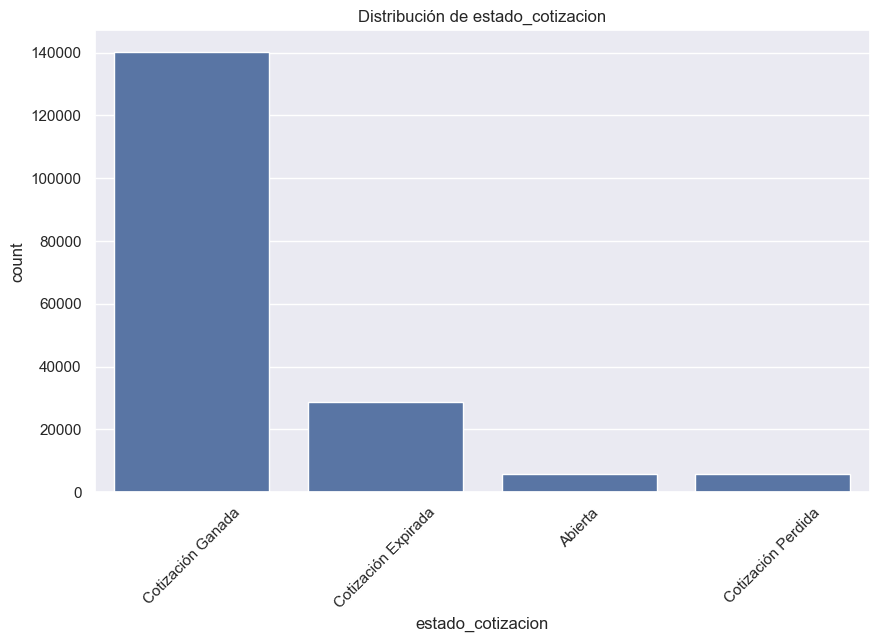

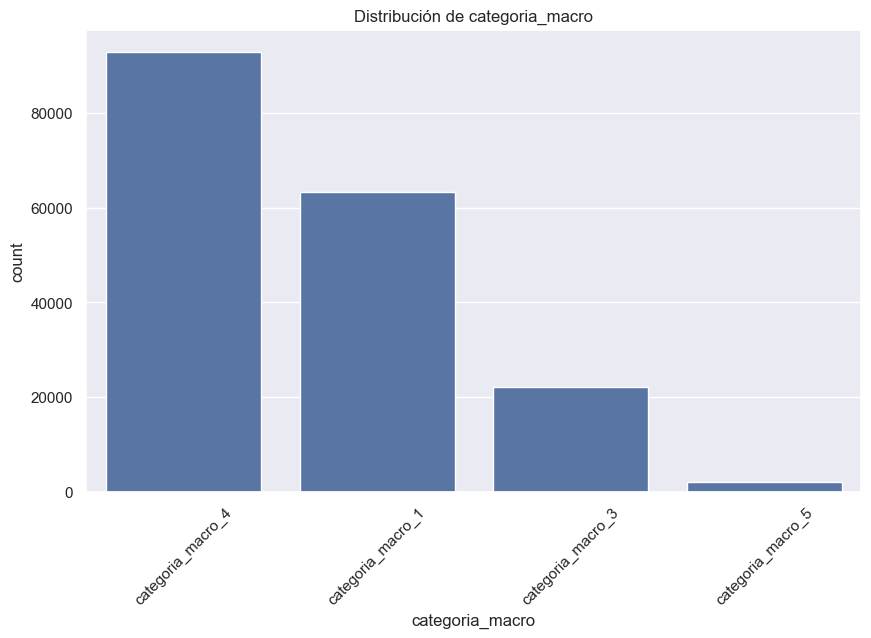

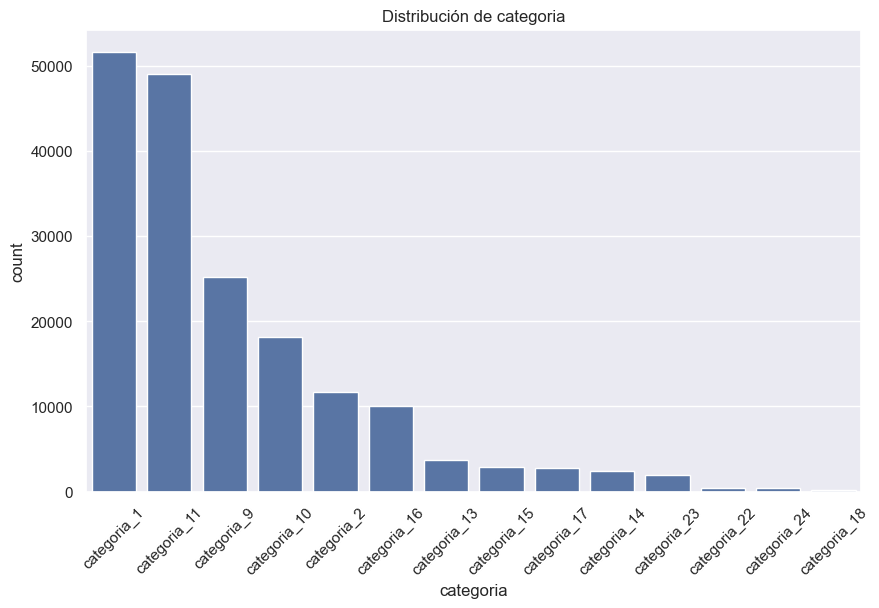

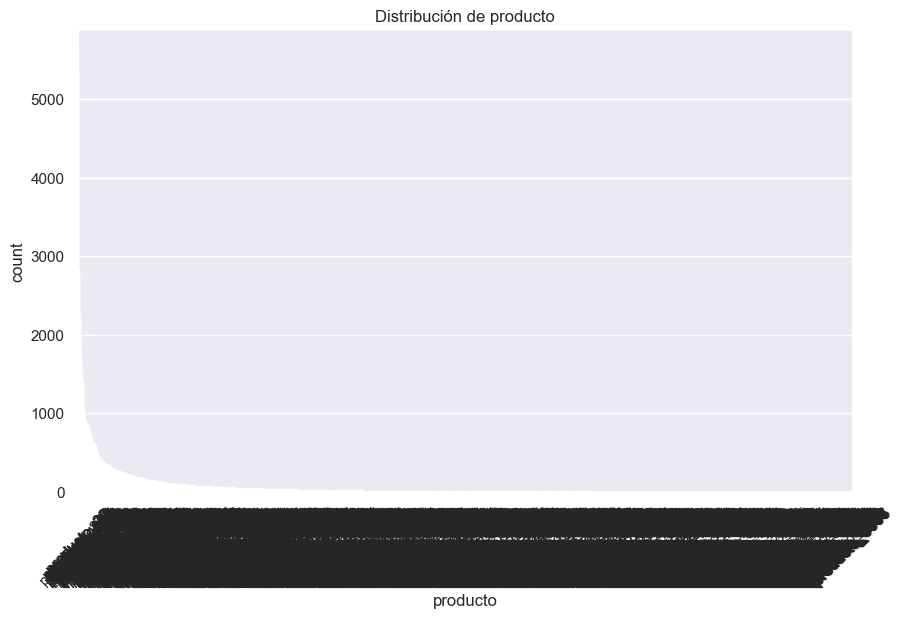

In [82]:
for col in categorical_cols:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df_cot_B2C, x=col, order=df_cot_B2C[col].value_counts().index)
    plt.title(f'Distribución de {col}')
    plt.xticks(rotation=45)
    plt.show()

### 1.3 Análisis Calidad de Datos

In [83]:
# COMPLETITUD
df_porcentajes = (100*df_cot_B2C.isna().sum()/len(df_cot_B2C)).to_frame()
df_porcentajes.sort_values(0, ascending = False)

,0
cotizacion,0.0
estado_cotizacion,0.0
id,0.0
fecha_creacion,0.0
fecha_modificacion,0.0
categoria_macro,0.0
categoria,0.0
producto,0.0
cantidad,0.0
precio,0.0


Los datos en la base de cotizaciones B2C están Completos

In [84]:
# UNICIDAD


duplicados=df_cot_B2C[df_cot_B2C.duplicated()].value_counts()
print(duplicados)

cotizacion  estado_cotizacion    id      fecha_creacion           fecha_modificacion   categoria_macro    categoria     producto       cantidad  precio     valor    
7591150.0   Cotización Ganada    356265  1972-11-02 09:30:46.730  1972-11-26 11:38:16  categoria_macro_1  categoria_1   producto_1719  2.0       7.349429   14.698858    4
4605987.0   Abierta              70369   1972-12-02 09:39:09.573  1972-12-04 10:48:55  categoria_macro_4  categoria_11  producto_27    1.0       0.364572   0.364572     3
3923662.0   Cotización Expirada  419331  1972-07-31 17:25:39.393  1972-08-05 09:10:21  categoria_macro_4  categoria_11  producto_847   1.0       5.572143   5.572143     3
                                                                                                                        producto_648   1.0       3.239714   3.239714     3
2203770.0   Cotización Ganada    224816  1972-07-28 15:27:25.143  1972-07-29 10:15:46  categoria_macro_4  categoria_10  producto_1603  1.0       93.59

Hay evidencia de un problema de duplicados en esta base de datos

In [85]:
#CONSISTENCIA VARIABLES NUMÉRICAS
df_cot_B2C[numeric_cols].describe()

,cotizacion,id,cantidad,precio,valor
count,1.803870e+05,180387.000000,180387.000000,180387.000000,180387.000000
mean,5.078489e+06,201958.376563,30.337815,18.897239,36.905377
std,2.330758e+06,131817.410108,1128.197335,43.212077,884.640566
min,1.330102e+06,9.000000,0.000000,0.000000,0.000000
25%,3.014320e+06,90794.500000,1.000000,1.702715,2.850289
50%,4.625202e+06,156082.000000,1.000000,6.844000,9.495428
75%,7.073812e+06,357146.000000,2.000000,19.214571,27.657714
max,9.660005e+06,429016.000000,438000.000000,3087.911715,366411.673079


In [86]:
#CONSISTENCIA VARIABLES CATEGÓRICAS
df_cot_B2C[categorical_cols].value_counts()

estado_cotizacion    categoria_macro    categoria     producto     
Cotización Ganada    categoria_macro_4  categoria_11  producto_28      4903
                                                      producto_277     4477
                     categoria_macro_1  categoria_1   producto_4637    2593
                     categoria_macro_4  categoria_11  producto_27      2414
                                                      producto_188     2247
                                                                       ... 
                                                      producto_6118       1
                                                      producto_6099       1
Cotización Expirada  categoria_macro_3  categoria_16  producto_6028       1
                                                      producto_6082       1
Cotización Perdida   categoria_macro_5  categoria_23  producto_7052       1
Name: count, Length: 6535, dtype: int64

In [87]:
#VALIDEZ
date_var1 = pd.to_datetime(df_cot_B2C['fecha_creacion'], errors='coerce')
date_var1.isnull().sum()

date_var2 = pd.to_datetime(df_cot_B2C['fecha_modificacion'], errors='coerce')
date_var2.isnull().sum()

0

### 1.4 Revisión de Correlación

In [88]:
df_cot_B2C[["valor", "cotizacion"]].corr()

,valor,cotizacion
valor,1.000000,-0.004515
cotizacion,-0.004515,1.000000


In [89]:
df_cot_B2C[["id", "cotizacion"]].corr()

,id,cotizacion
id,1.00000,0.03205
cotizacion,0.03205,1.00000


In [90]:
df_cot_B2C[["valor", "precio"]].corr()

,valor,precio
valor,1.000000,0.055652
precio,0.055652,1.000000


## 2. Preparación de datos

#### Solución Unicidad

Se eliminaron las entradas duplicadas, estas representaban el 1.1% de la base

In [91]:
duplicates = df_cot_B2C.duplicated().sum()
if duplicates > 0:
    print(f"Eliminando {duplicates} filas duplicadas...")
    df_cot_B2C.drop_duplicates(inplace=True)

Eliminando 2009 filas duplicadas...


#### Solución Validez

**Variable VALOR**
Ya que el valor debe ser igual a la cantidad por el precio de producto vendido debe ser choerente con dichas variables. Como se evidencian 28 valores asignados a 0 se recalcula la multiplicación entre cantidad y precio y se le asiga dicho resultado, si este sigue siendo 0 se elimina la entrada ya que se considera como error en la base de datos transaccional

In [92]:
# Reemplazar valores 0
df_cot_B2C.loc[df_cot_B2C['valor'] == 0, 'valor'] = df_cot_B2C['cantidad'] * df_cot_B2C['precio']

# Eliminar los que siguen siendo 0
df_cot_B2C = df_cot_B2C[df_cot_B2C['valor'] != 0]

#### Solución Skew (Asimetría)

Se aplica la transformación log1p para las columnas asimétricas con valores positivos

In [93]:
df_cot_B2C['log_cantidad'] = np.log1p(df_cot_B2C['cantidad'])
df_cot_B2C['log_valor'] = np.log1p(df_cot_B2C['valor'])